In [1]:
import numpy as np
import matplotlib
from matplotlib import colors
import matplotlib.pyplot as plt
import matplotlib.image as image
import geone
import geone.covModel as gcm
import geone.imgplot3d as imgplt3
import pyvista as pv
import copy
import rasterio
from rasterio.transform import from_origin
import sys
import yaml
import os

#For loading ArchPy, the path where ArchPy is must be added with sys
try:
    import ArchPy
except: # if ArchPy is not installed
    print("ArchPy not installed")
    sys.path.append("C:/Users/Noah/ArchPy/")
    import ArchPy

sys.path.append("C:/Users/Noah/ArchPy/")
#my modules
from ArchPy.base import * #ArchPy main functions
from ArchPy.tpgs import * #Truncated plurigaussians
from ArchPy.inputs import * #Truncated plurigaussians

ArchPy not installed


In [2]:
sector_img = image.imread('sector_map.png')

In [3]:
#Model limits
X0 = 2499498 #Model x0 coordinate 
Y0 = 1125350 #Model y0 coordinate 
X1 = 2502460
Y1 = 1128167

In [4]:
bh_lbh = np.loadtxt("data_folder/versoix_bh.lbh", delimiter=";", skiprows=1)

bh_xs = bh_lbh[:,1]
bh_ys = bh_lbh[:,2]
bh_ds = bh_lbh[:,4]

In [5]:
#load file
ws = 'ArchPy_workspace'
T1 = import_project("Versoix_model", ws=ws)

### IMPORTING PROJECT Versoix_model IN C:/Users/Margaux/OneDrive - unine.ch/Documents/Unine/Master Thesis/3. Versoix model/ArchPy Model/ArchPy_workspace DIRECTORY ### 

Unit u12: Surface added for interpolation
Facies a added to unit u12
Facies b added to unit u12
Facies bc added to unit u12
Facies c added to unit u12
Facies d added to unit u12
Unit u14: Surface added for interpolation
Facies Molasse added to unit u14
Unit u3: Surface added for interpolation
Facies Soil added to unit u3
Facies a added to unit u3
Facies ab added to unit u3
Facies b added to unit u3
Facies ac added to unit u3
Facies bc added to unit u3
Facies c added to unit u3
Facies d added to unit u3
Facies e added to unit u3
Unit u7: Surface added for interpolation
Facies a added to unit u7
Facies ab added to unit u7
Facies b added to unit u7
Facies bc added to unit u7
Facies c added to unit u7
Facies d added to unit u7
Facies e added to unit u7
Unit u9: Surface added for interpolation
Facies a added to unit u9
Facie

In [6]:
ny = T1.get_ny()
nx = T1.get_nx()
nz = T1.get_nz()

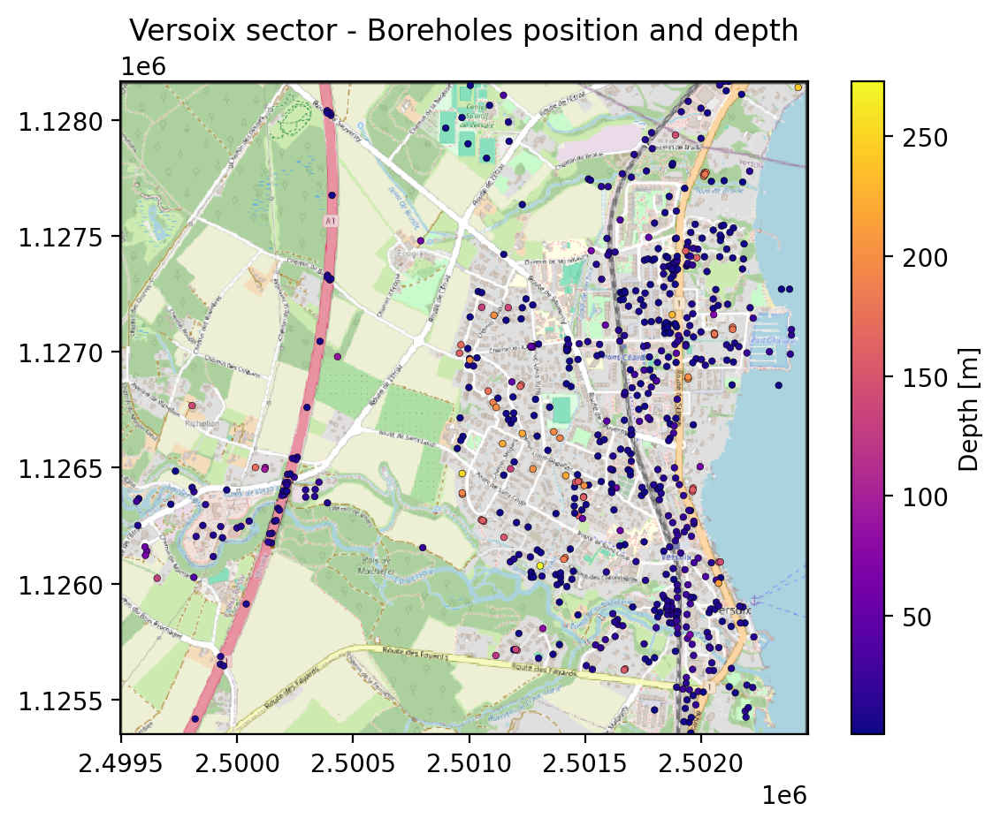

In [7]:
plt.figure(dpi=200)
plt.imshow(sector_img, extent=(X0, X1, Y0, Y1))
plt.scatter(bh_xs,bh_ys,s=30,c=bh_ds,marker='.',cmap='plasma', edgecolors='k', linewidth=0.2)
plt.colorbar(label='Depth [m]')
plt.title('Versoix sector - Boreholes position and depth')
plt.show()

In [8]:
PATH_BOREHOLES = "data_folder"

In [9]:
# Import borehole data
list_bh = np.array(pd.read_csv(os.path.join(PATH_BOREHOLES, "versoix_bh.lbh"), delimiter=';'))
units_data = np.array(pd.read_csv(os.path.join(PATH_BOREHOLES, "versoix_bh.ud"), delimiter=';'))
facies_data = np.array(pd.read_csv(os.path.join(PATH_BOREHOLES, "versoix_bh.fd"), delimiter=';'))

In [10]:
list_bh.shape, units_data.shape, facies_data.shape

((628, 5), (1058, 4), (1143, 4))

### Borehole selection

In [11]:
#Selection of boreholes, that will be plotted on the top-view maps below

#sel_fa = ['a','ab','b','ac','bc','c','d','e','Soil','Molasse']  # All facies
sel_fa = ['ac','bc','c','d','e']
#sel_u = ['u3','u7','u9','u12','u14']  # All units
sel_u = ['u9']
bhs_sel = []
bhs_plt = []

for i in facies_data:
    id_admin = i[0]
    id_depth = i[2]
    if i[1] in sel_fa :
        for j in units_data:
            if j[0] == id_admin and j[1] in sel_u and id_depth <= j[2] and id_depth >= j[3]:
                bhs_sel.append(id_admin)
                break

for k in list_bh:
    if k[0] in bhs_sel:
        bhs_plt.append([k[0],k[1],k[2]])

In [12]:
#Second set of boreholes (for comparison purposes)

sel_fa = ['a','ab','b']  # (more) permeable facies
#sel_fa = ['ac','bc','c','d','e']  # (more) impermeable facies
#sel_u = ['u7','u9','u12']
sel_u = ['u9']
bhs_sel1 = []
bhs_plt1 = []

for i in facies_data:
    id_admin = i[0]
    id_depth = i[2]
    if i[1] in sel_fa :
        for j in units_data:
            if j[0] == id_admin and j[1] in sel_u and id_depth <= j[2] and id_depth >= j[3]:
                bhs_sel1.append(id_admin)
                break

for k in list_bh:
    if k[0] in bhs_sel1:
        bhs_plt1.append([k[0],k[1],k[2]])

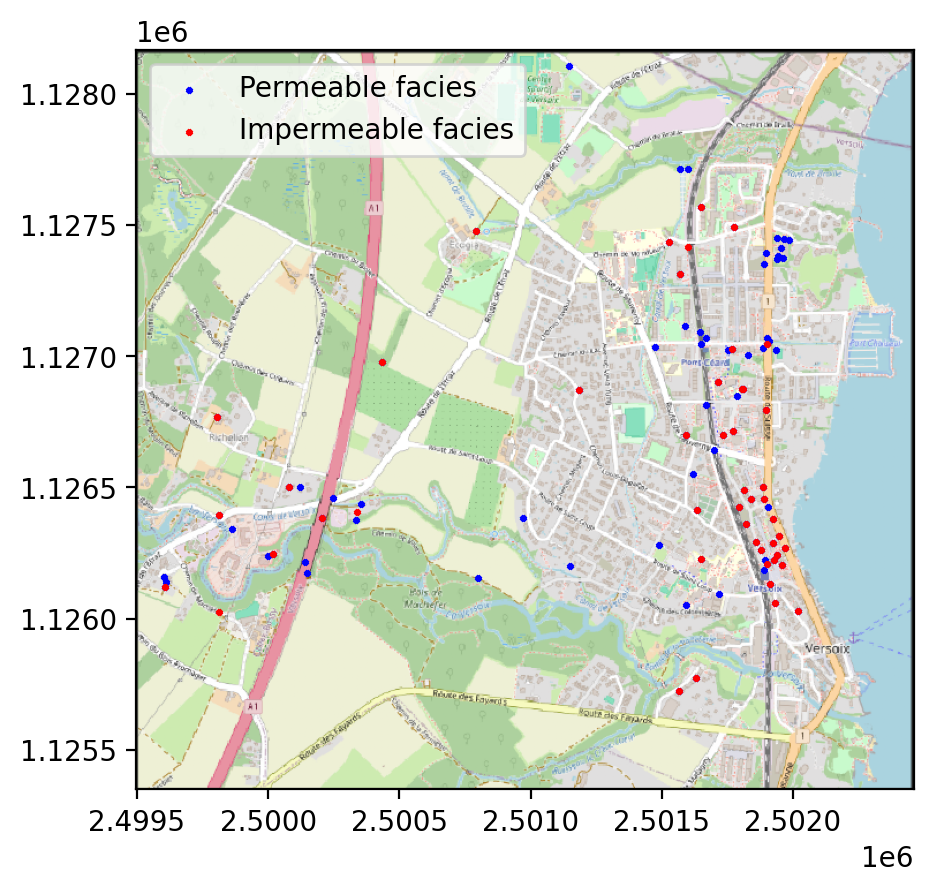

In [13]:
plt.figure(dpi=200)
plt.imshow(sector_img, extent=(X0, X1, Y0, Y1))
plt.scatter(x=np.array(bhs_plt1)[:,1], y=np.array(bhs_plt1)[:,2], s=3,c='b',marker='x',label='Permeable facies')
plt.scatter(x=np.array(bhs_plt)[:,1], y=np.array(bhs_plt)[:,2], s=3,c='r',marker='x',label='Impermeable facies')
#plt.colorbar(label='Depth [m]')
#plt.title('Versoix sector - Boreholes position and depth')
plt.legend()
plt.show()

### Alluvion Ancienne 3D

In [14]:
mask_ID = np.array([0.0 ,1.0, 2.0, 4.0, 5.0])

In [15]:
iu = 0
#T1.plot_units(iu=iu, excludedVal=mask_ID)

In [16]:
# load and resample topographic map
R = T1.resample2grid("data_folder/swiss-map-raster200_versoix.tif", band=0)
G = T1.resample2grid("data_folder/swiss-map-raster200_versoix.tif", band=1)
B = T1.resample2grid("data_folder/swiss-map-raster200_versoix.tif", band=2)

# reshape to match pyvista format
R_copy = R.T.reshape(nx, ny, 1)
G_copy = G.T.reshape(nx, ny, 1)
B_copy = B.T.reshape(nx, ny, 1)
arr = np.concatenate((R_copy, G_copy, B_copy), axis=2)  # array to plot
arr = arr.astype(int)

# exemple of a plot of a DEM with topographic map on it
self = T1
z0=self.get_oz()
v_ex=5

p = pv.Plotter()
X, Y=np.meshgrid(self.get_xgc(), self.get_ygc())  # surface coordinates
grid=pv.StructuredGrid(X, Y, (self.top-z0)*v_ex+z0)  # DEM

grid["RGB"] = arr.reshape(-1, 3)  # add array to
p.add_mesh(grid, opacity=.8, interpolate_before_map=False, rgb=True)

p2 = T1.plot_units(iu=iu, excludedVal=mask_ID, plotter=p,v_ex=v_ex)

p.show()

Widget(value='<iframe src="http://localhost:53741/index.html?ui=P_0x26fe6687250_0&reconnect=auto" class="pyvis…

### Shannon Entropy

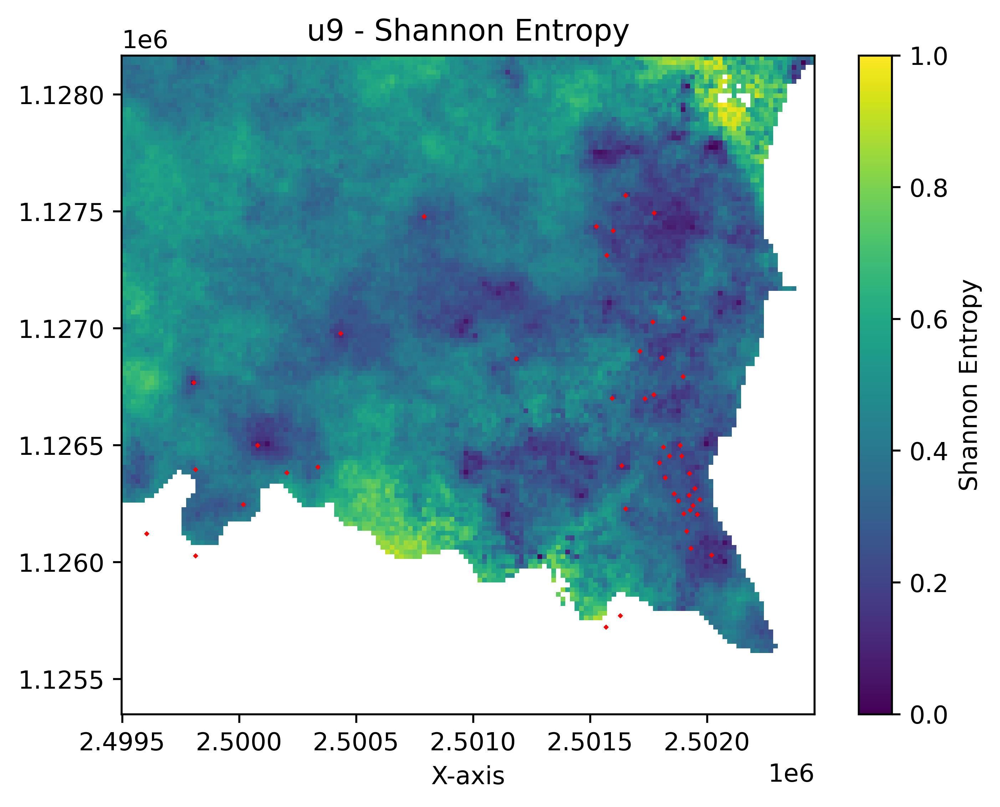

In [17]:
#Top view - Shannon Entropy

TV_SE_unit = "u9"

surf_m = []

for iu in range(T1.nreal_units):
    for ifa in range(T1.nreal_fa):
        for ip in range(T1.nreal_prop):
            
            arr = T1.get_prop("K", iu=iu, ifa=ifa, ip=ip, all_data=False).copy()  
            mask_unit9 = T1.unit_mask(TV_SE_unit, iu=iu).astype(bool)
            surf_m.append(mask_unit9)

surf_m_all = np.nanmean(surf_m).astype(bool)

SE = T1.get_entropy(recompute=True)

SE[~surf_m_all] = np.nan

SE_AA = np.nanmean(SE,axis=0)

plt.figure(dpi=500)
plt.imshow(SE_AA[::-1, :], cmap='viridis',extent=(X0, X1, Y0, Y1))
plt.colorbar(label='Shannon Entropy')
plt.scatter(x=np.array(bhs_plt)[:,1], y=np.array(bhs_plt)[:,2], s=1,c='r',marker='x',label='Boreholes')
plt.title(f'{TV_SE_unit} - Shannon Entropy')
plt.xlabel('X-axis')
plt.show()

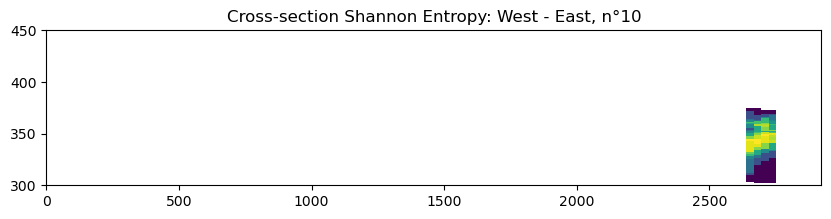

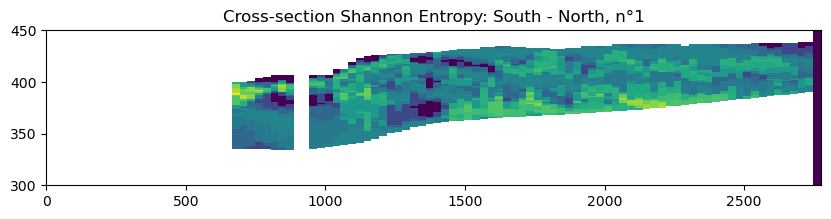

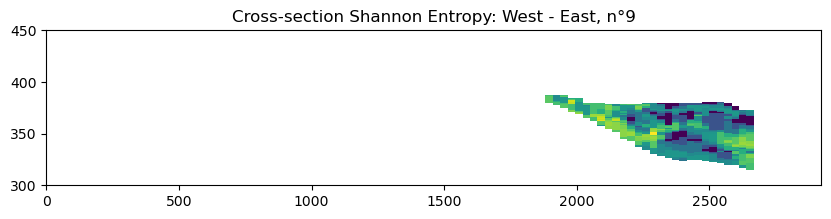

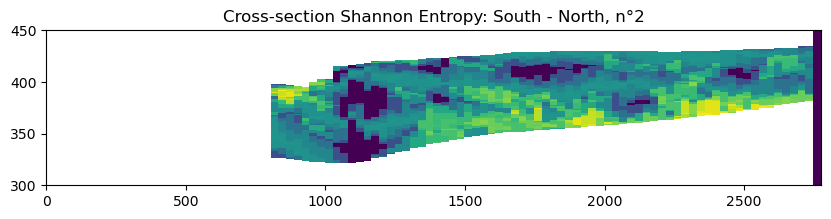

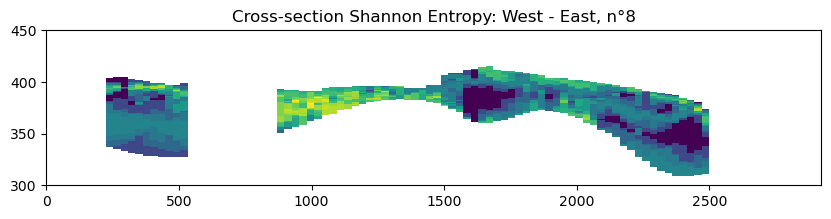

...

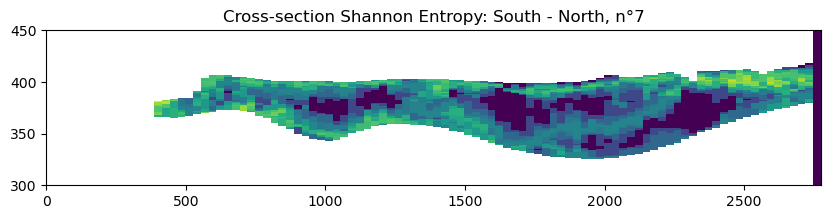

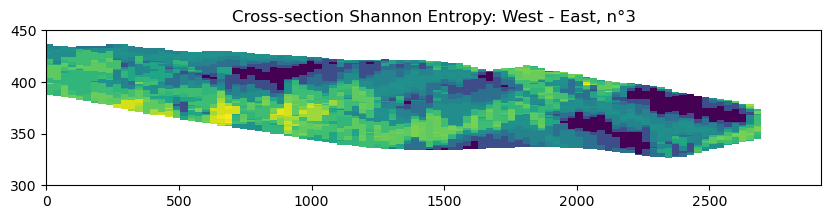

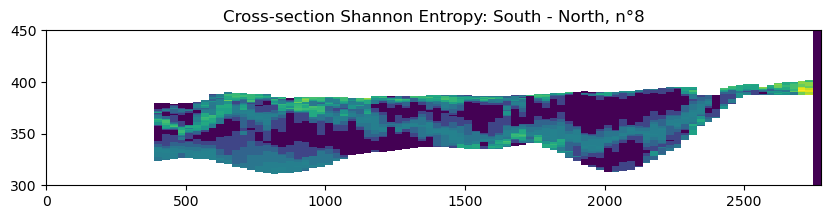

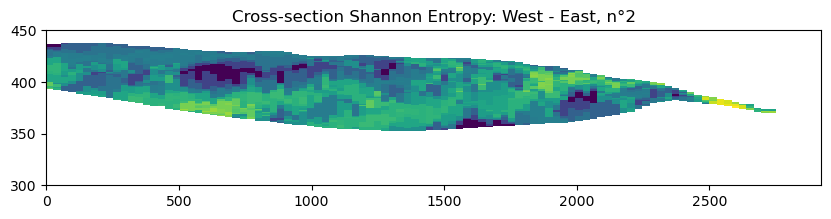

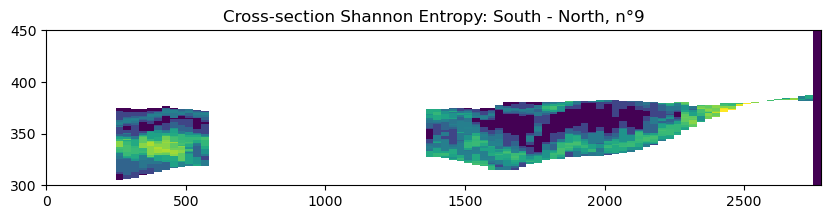

In [18]:
nb_cs = 10

entropy_type = 'entropy_units' # 'entropy_units' or 'entropy_facies'
bh_type = 'unit' # 'unit' or 'facies'

for i_cs in range(1,nb_cs):

    T1.plot_cross_section([(X0+20,Y0 + i_cs*(Y1-Y0)/nb_cs),(X1-20,Y0 + i_cs*(Y1-Y0)/nb_cs)],ratio_aspect=5,typ=entropy_type,dist_max=150,width=10,bh_type=bh_type)
    plt.title(f'Cross-section Shannon Entropy: West - East, n°{11-i_cs}')
    plt.show()

    T1.plot_cross_section([(X0 + i_cs*(X1-X0)/nb_cs,Y0 + 20),(X0 + i_cs*(X1-X0)/nb_cs,Y1-20),(X0 + i_cs*(X1-X0)/nb_cs,Y1-20)],ratio_aspect=5,typ=entropy_type,dist_max=150,width=10,bh_type=bh_type)
    plt.title(f'Cross-section Shannon Entropy: South - North, n°{i_cs}')
    plt.show()

### Hydraulic Conductivity, Thickness and Standard Deviation

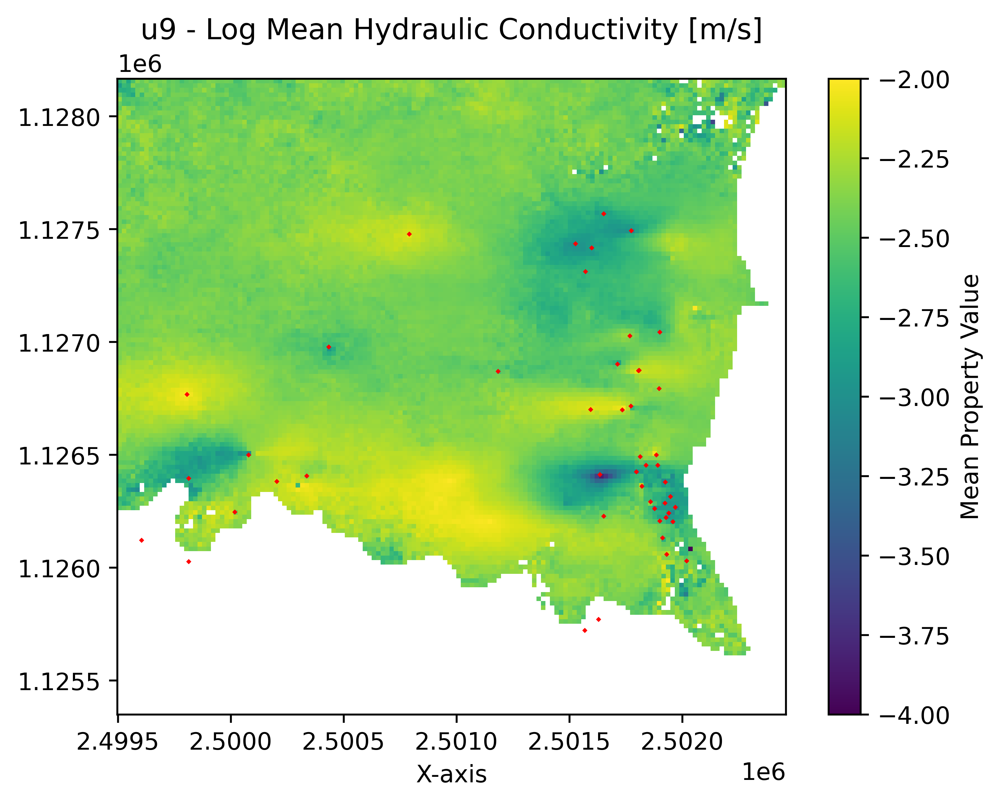

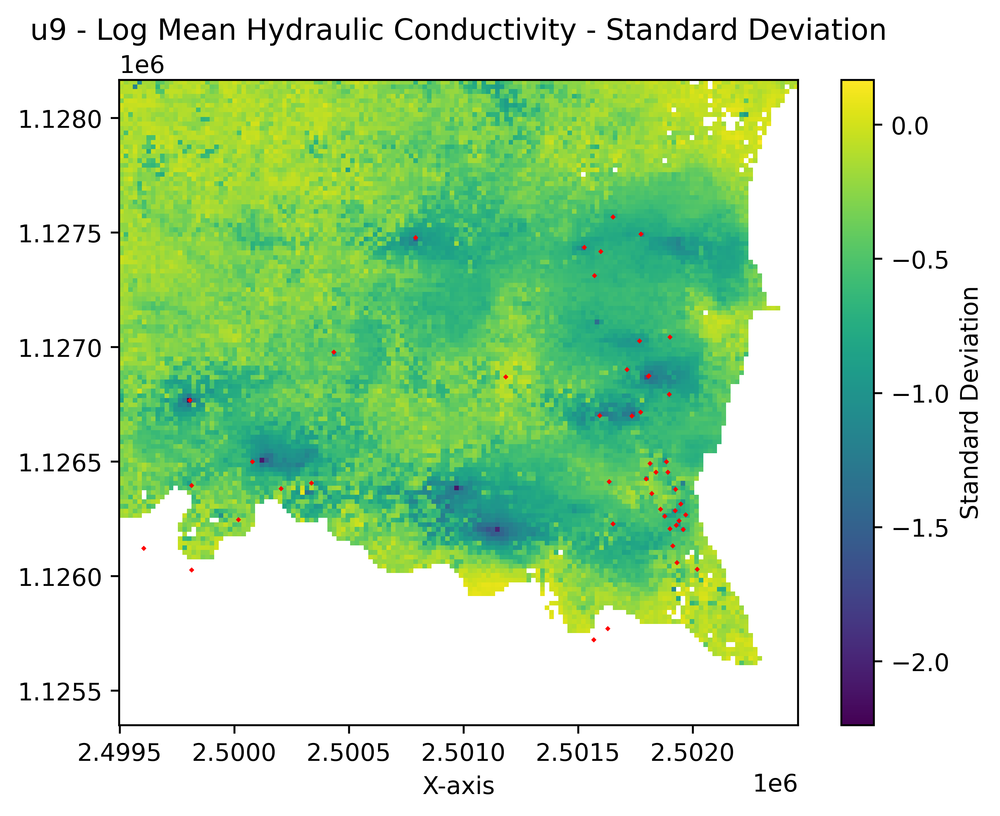

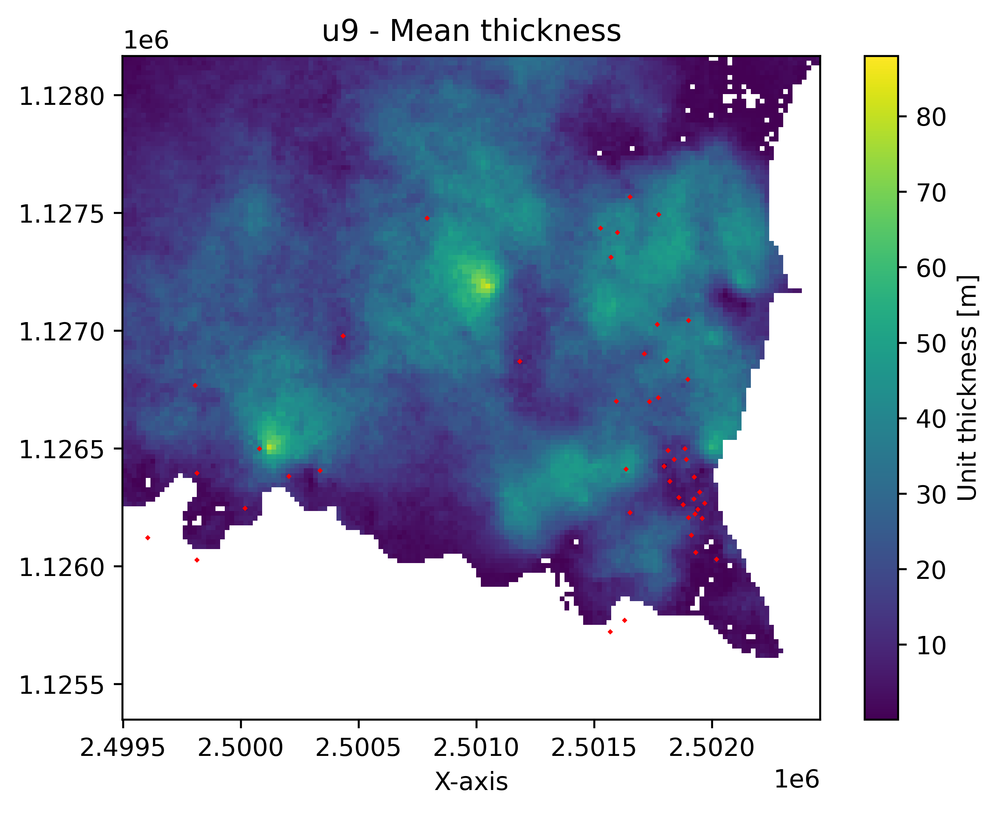

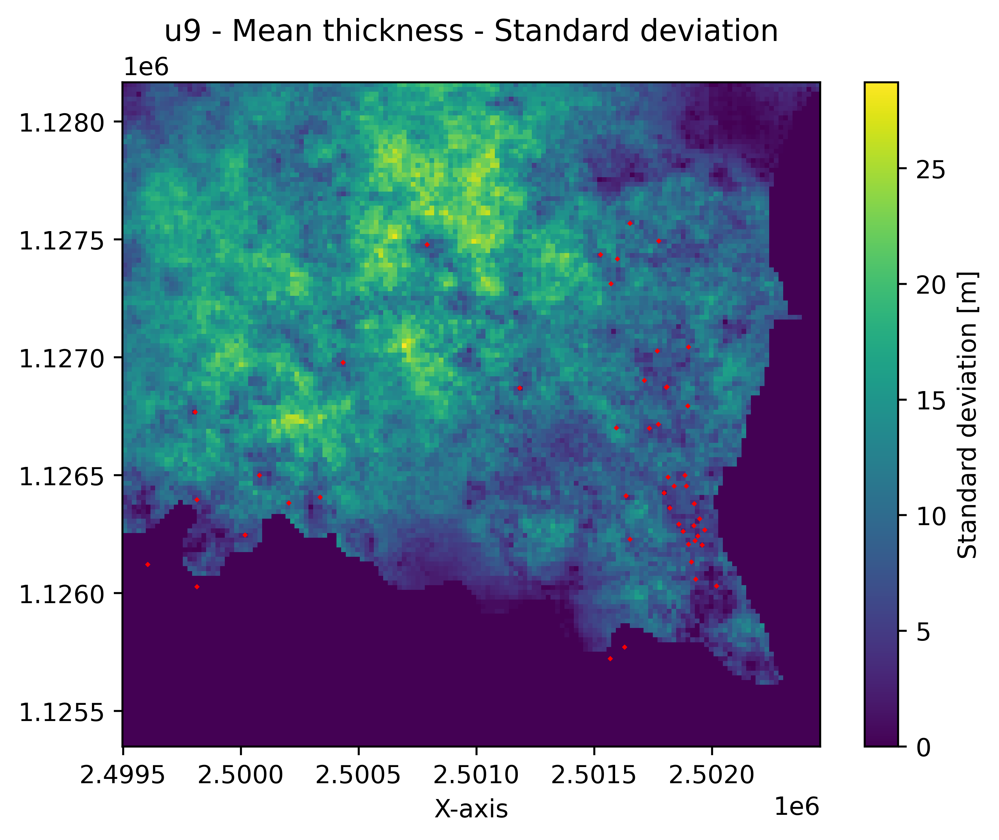

In [19]:
Unit_sel_K_thk_std = "u9"

K_moy_m = []
T_moy_m = []
thk_moy_m = []

for iu in range(T1.nreal_units):
    for ifa in range(T1.nreal_fa):
        for ip in range(T1.nreal_prop):
            arr = T1.get_prop("K", iu=iu, ifa=ifa, ip=ip, all_data=False).copy()  
            # get the property array, important to copy it
            

            mask_unit9 = T1.unit_mask(Unit_sel_K_thk_std, iu=iu).astype(bool)
            
            mask_unit = mask_unit9
            arr[~mask_unit] = np.nan  # set the values outside the unit to NaN
            
            thk = np.sum(~np.isnan(arr), axis=0)  # count the number of non-NaN values in each column
            
            K_moy = np.nanmean(10**arr, axis=0)  # calculate the mean of the property values in each colum
            
            T_moy = K_moy * thk  # calculate the mean of the property values in each column multiplied by the thickness
            thk_moy_m.append(thk)
        
            K_moy_m.append(K_moy)
            T_moy_m.append(T_moy)

K_moy_all = np.nanmean(K_moy_m, axis=0)
T_moy_all = np.nanmean(T_moy_m, axis=0)
log_k_all = np.log10(K_moy_all)
log_t_all = np.log10(T_moy_all)

std_k_all = np.nanstd(np.log10(K_moy_m), axis=0)
std_thk_all = np.nanstd(thk_moy_m, axis=0)
thk_all = np.nanmean(thk_moy_m, axis=0)

for i in range(len(thk_all)):
    for j in range(len(thk_all[0])):
        if thk_all[i,j] == 0:
            thk_all[i,j] = np.nan


plt.figure(dpi=500)
plt.imshow(np.log10(K_moy_all[::-1, :]), cmap='viridis',extent=(X0, X1, Y0, Y1))
plt.colorbar(label='Mean Property Value')
plt.scatter(x=np.array(bhs_plt)[:,1], y=np.array(bhs_plt)[:,2], s=1,c='r',marker='x',label='Boreholes')
plt.title(f'{Unit_sel_K_thk_std} - Log Mean Hydraulic Conductivity [m/s]')
plt.xlabel('X-axis')
plt.show()

plt.figure(dpi=500)
plt.imshow(np.log10(std_k_all[::-1, :]), cmap='viridis',extent=(X0, X1, Y0, Y1))
plt.colorbar(label='Standard Deviation')
plt.scatter(x=np.array(bhs_plt)[:,1], y=np.array(bhs_plt)[:,2], s=1,c='r',marker='x',label='Boreholes')
plt.title(f'{Unit_sel_K_thk_std} - Log Mean Hydraulic Conductivity - Standard Deviation')
plt.xlabel('X-axis')
plt.show()

plt.figure(dpi=500)
plt.imshow(thk_all[::-1, :], cmap='viridis',extent=(X0, X1, Y0, Y1),vmin=0.1,vmax=88)
plt.colorbar(label='Unit thickness [m]')
plt.scatter(x=np.array(bhs_plt)[:,1], y=np.array(bhs_plt)[:,2], s=1,c='r',marker='x',label='Boreholes')
plt.title(f'{Unit_sel_K_thk_std} - Mean thickness')
plt.xlabel('X-axis')
plt.show()

plt.figure(dpi=500)
plt.imshow(std_thk_all[::-1, :], cmap='viridis',extent=(X0, X1, Y0, Y1))
plt.colorbar(label='Standard deviation [m]')
plt.scatter(x=np.array(bhs_plt)[:,1], y=np.array(bhs_plt)[:,2], s=1,c='r',marker='x',label='Boreholes')
plt.title(f'{Unit_sel_K_thk_std} - Mean thickness - Standard deviation')
plt.xlabel('X-axis')
plt.show()

### Alluvion Ancienne surfaces - Cross-sections (not displayed in the master thesis)

In [20]:
from collections import Counter

In [21]:
nx = T1.get_nx()
ny = T1.get_ny()
nz = T1.get_nz()
arr_all=T1.get_units_domains_realizations(fill="ID")
arr = np.zeros((nz,ny,nx))

for z in range(nz):
    for y in range(ny):
        for x in range(nx):
            unit_list = arr_all[:,z,y,x]
            freq = Counter(np.ndarray.flatten(unit_list))
            res = sorted(np.ndarray.flatten(unit_list), key=lambda x: -freq[x]) # Sort list a based on frequency (highest frequency first)
            arr[z,y,x] = res[0]

unit_color = []
for z in range(nz):
    for y in range(ny):
        for x in range(nx):
            ID_unit = arr[z,y,x]
            unit_color.append([0.0, 0.0, 0.0, 0.0])

arr = np.reshape(unit_color, (nz,ny,nx,4))

In [22]:
top_moy_m = []

arr2 = T1.get_surfaces_unit(T1.get_unit('u9'), typ='top').copy()  
# get the property array, important to copy it

top_moy = np.nanmean(arr2, axis=0)  # calculate the mean of the property values in each colum

top_moy_m.append(top_moy)

top_moy_all = np.array(top_moy_m[0])
std_top_moy_all = np.nanstd(arr2, axis=0)

In [23]:
bot_moy_m = []

arr3 = T1.get_surfaces_unit(T1.get_unit('u9'), typ='bot').copy()  
# get the property array, important to copy it

bot_moy = np.nanmean(arr3, axis=0)  # calculate the mean of the property values in each colum

bot_moy_m.append(bot_moy)

bot_moy_all = np.array(bot_moy_m[0])
#bot_moy_all = np.nanmean(bot_moy_m, axis=0)
std_bot_moy_all = np.nanstd(arr3, axis=0)

In [24]:
#arr4 = T1.get_surfaces_unit(T1.get_unit('u3'), typ='top').copy()  
arr4 = T1.get_surface(typ='top')
arr5 = T1.get_surface(typ='bot')
# get the property array, important to copy it

top = arr4[0][0][0]
bot = arr5[0][4][0]
#bot_moy_all = np.nanmean(bot_moy_m, axis=0)
#std_bot_moy_all = np.nanstd(arr3, axis=0)

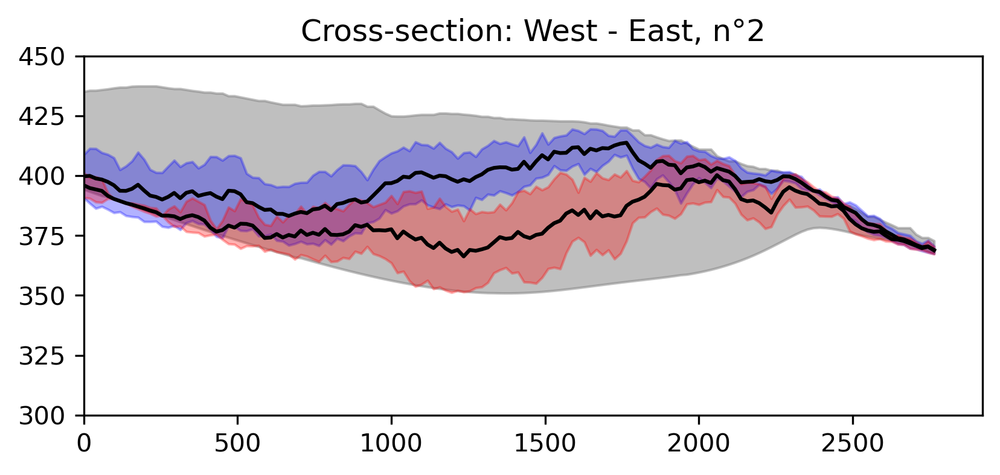

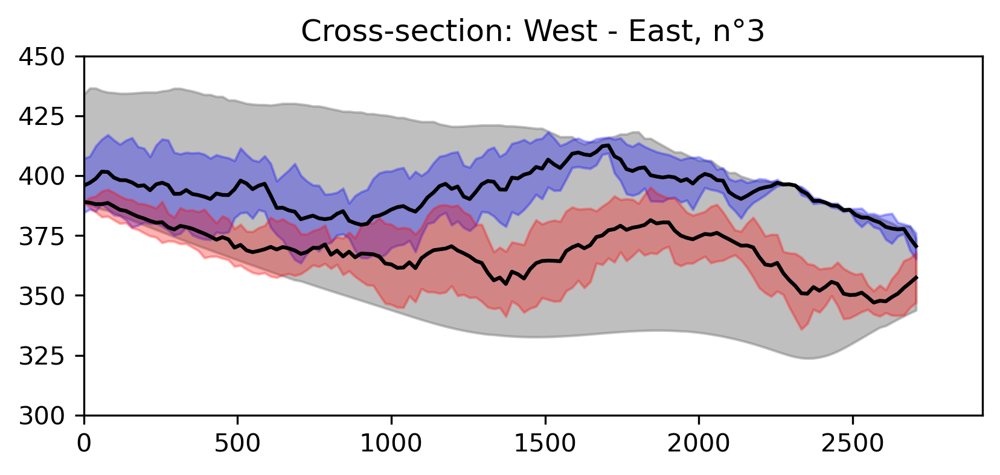

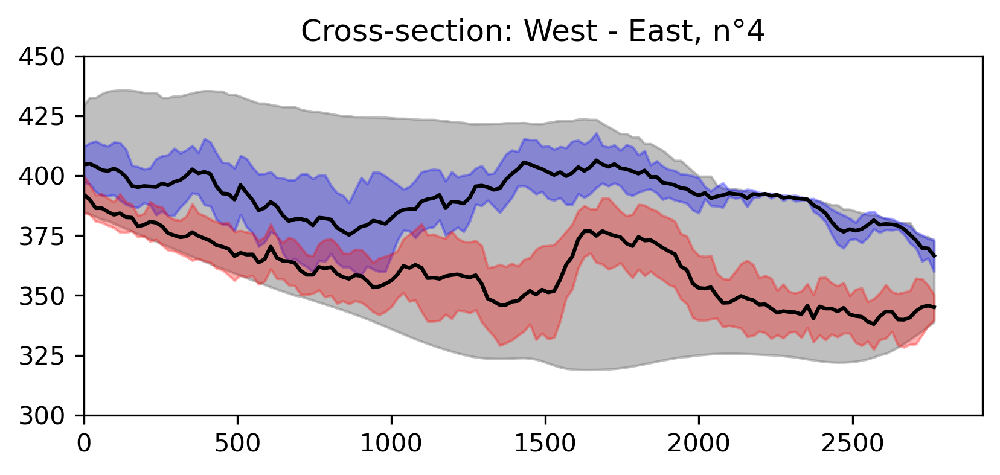

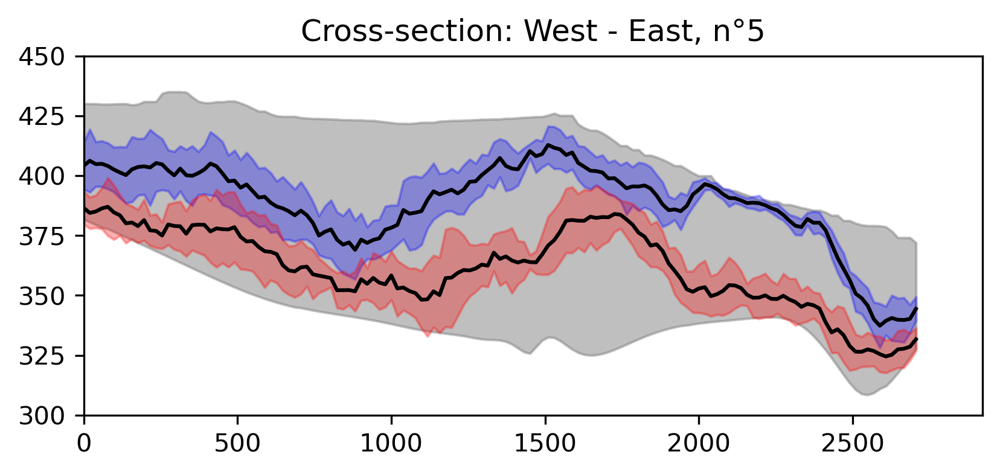

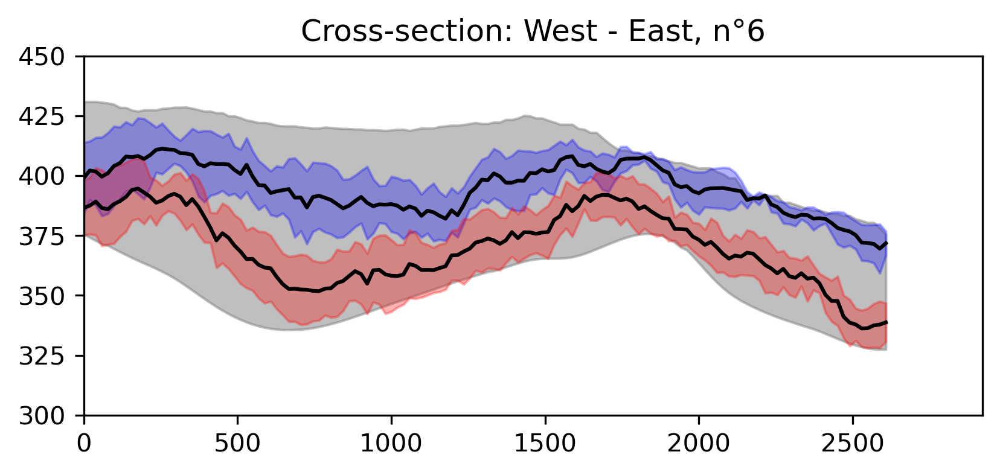

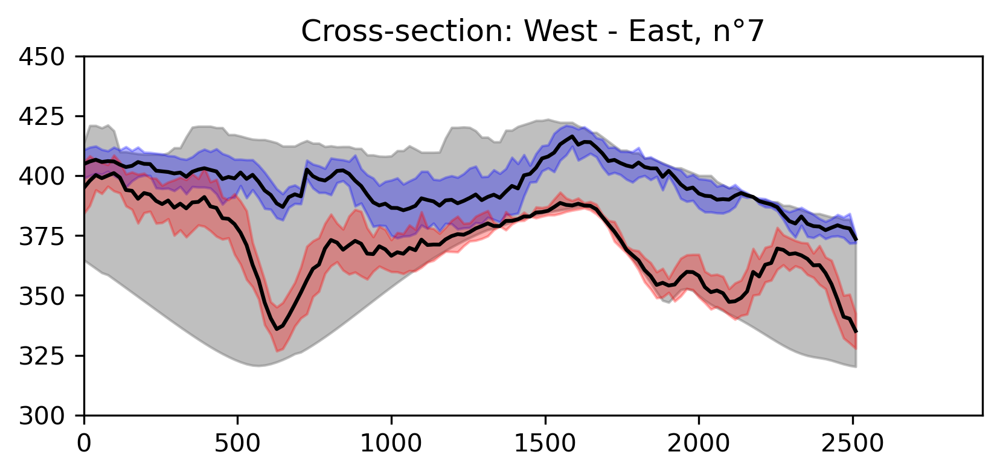

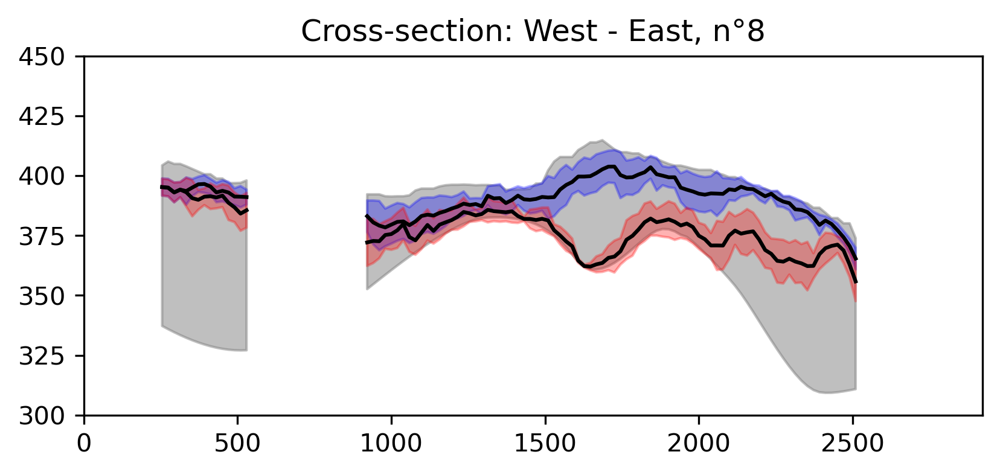

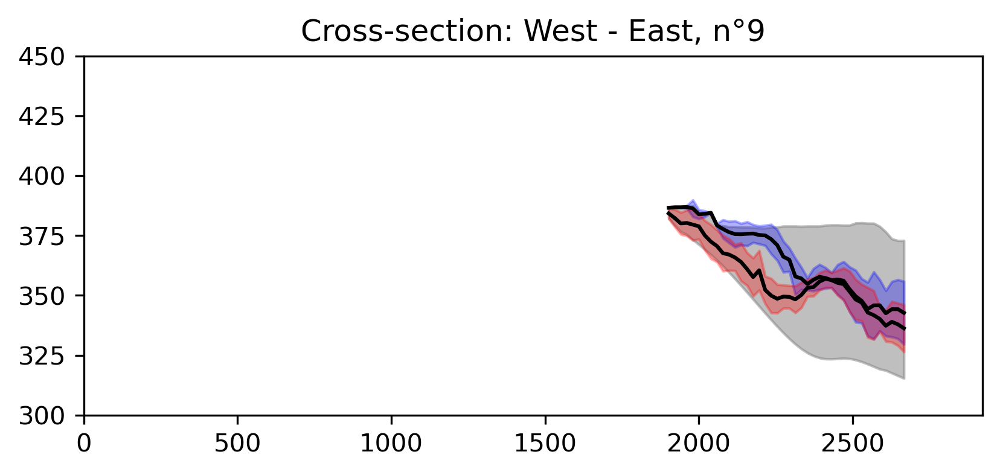

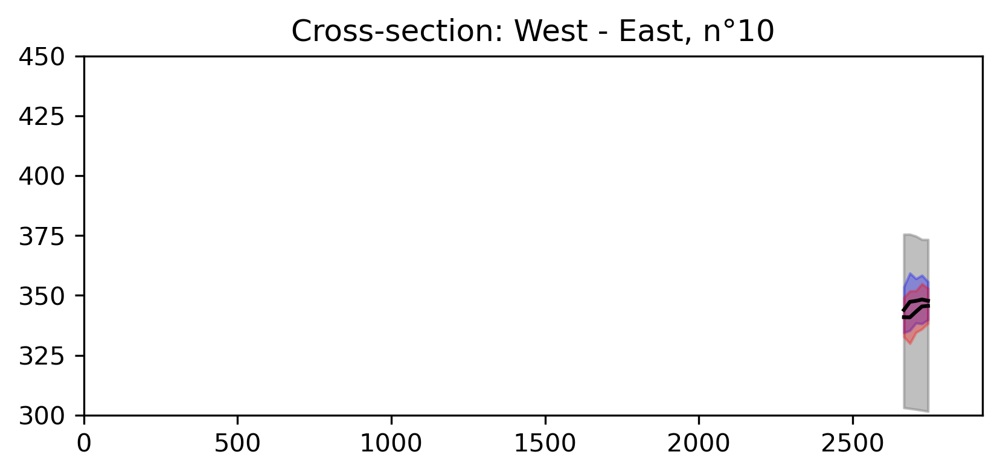

In [25]:
self = T1
ratio_aspect = 2.5
nb_cs = 10

for i_cs in range(1,nb_cs):
    
    p_list = [(X0+20,Y0 + i_cs*(Y1-Y0)/nb_cs),(X1-20,Y0 + i_cs*(Y1-Y0)/nb_cs)]
    p_list2 = [(X0+20,Y0 + (nb_cs-i_cs)*(Y1-Y0)/nb_cs),(X1-20,Y0 + (nb_cs-i_cs)*(Y1-Y0)/nb_cs)]
    
    sel_row = top_moy_all[::-1, :][int(ny*i_cs/nb_cs)]
    sel_row_std = std_top_moy_all[::-1, :][int(ny*i_cs/nb_cs)]
    
    sel_row_b = bot_moy_all[::-1, :][int(ny*i_cs/nb_cs)]
    sel_row_std_b = std_bot_moy_all[::-1, :][int(ny*i_cs/nb_cs)]
    
    sel_top = top[::-1, :][int(ny*i_cs/nb_cs)]
    sel_bot = bot[::-1, :][int(ny*i_cs/nb_cs)]
    
    fig, ax = plt.subplots(dpi=300)
    xsec, dist=self.cross_section(arr, p_list2)
    xs = np.linspace(0, dist, nx)
    
    for i in range(len(sel_row)):
        if sel_row[i] != sel_row[i]: #Check if nan, to cut the background color at the same size as the AA limits
            sel_top[i] = np.nan
            sel_bot[i] = np.nan
    
    extent=[0, dist, self.get_oz(), self.get_zg()[-1]]
    a=ax.imshow(xsec, origin="lower", extent=extent, interpolation="none")
    plt.fill_between(xs, sel_top, sel_bot, color='gray',alpha=0.5)
    plt.plot(xs,sel_row,'-',color='k')
    plt.fill_between(xs, sel_row - sel_row_std, sel_row + sel_row_std, color='b',alpha=0.3)
    plt.plot(xs,sel_row_b,'-',color='k')
    plt.fill_between(xs, sel_row_b - sel_row_std_b, sel_row_b + sel_row_std_b, color='r',alpha=0.3)
    ax.set_aspect(abs((extent[1]-extent[0])/(extent[3]-extent[2]))/ratio_aspect)
    plt.title(f'Cross-section: West - East, n°{1+i_cs}')
    plt.show()

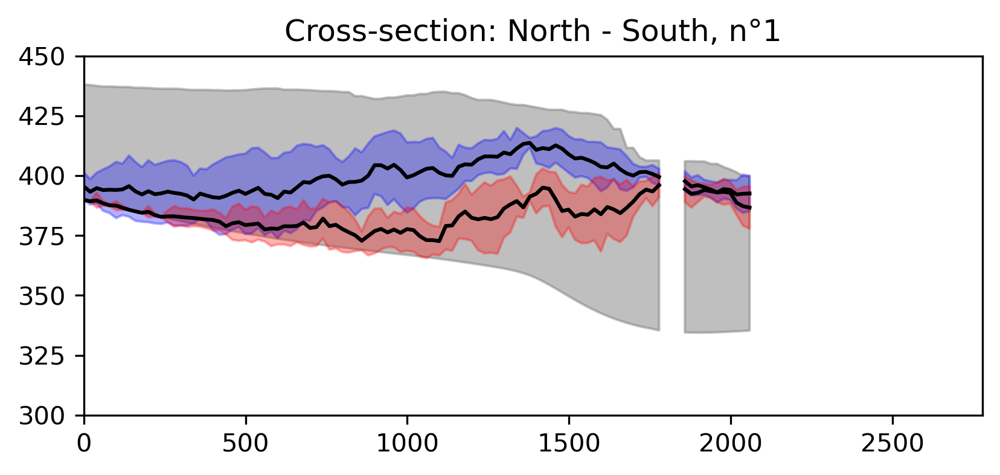

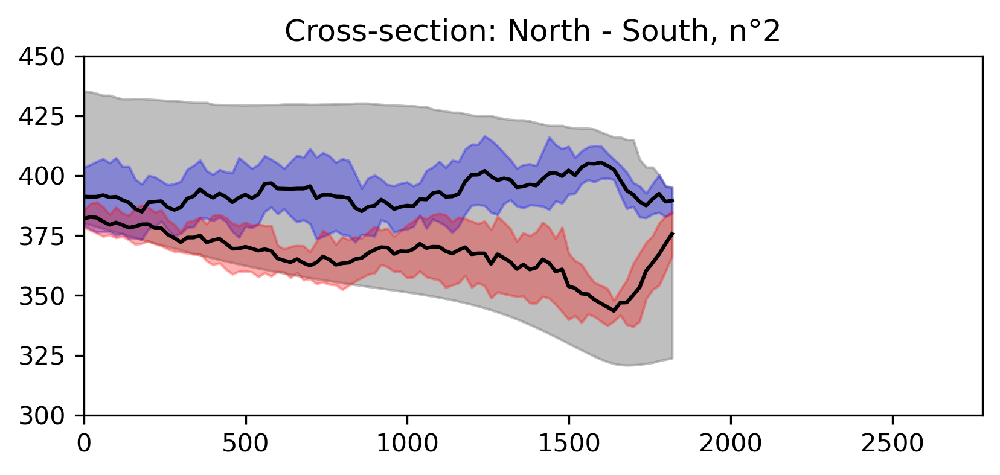

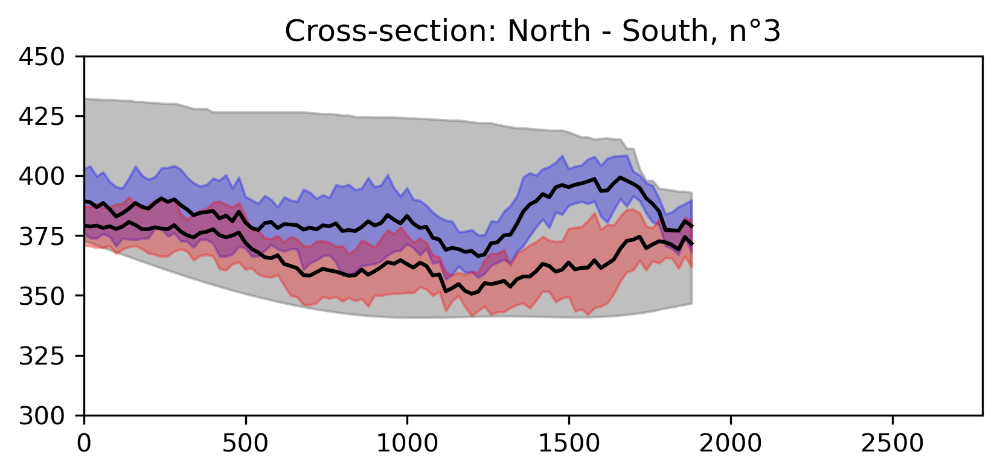

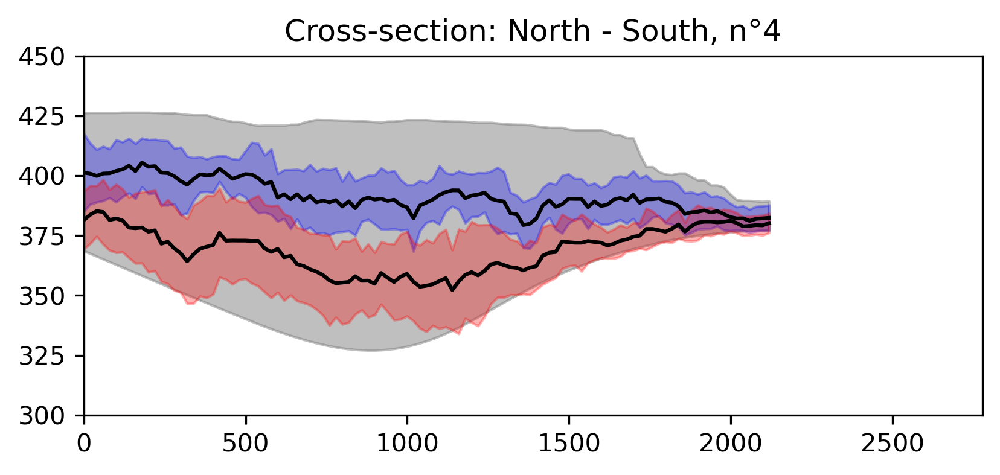

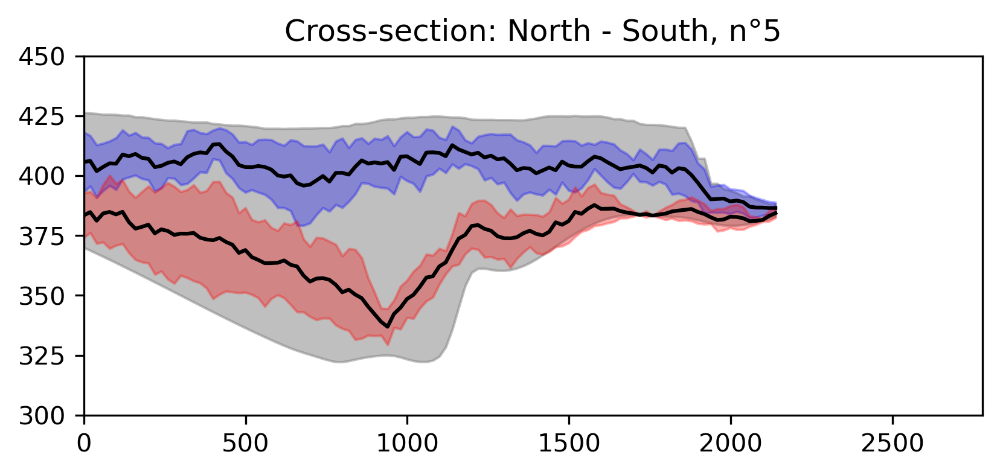

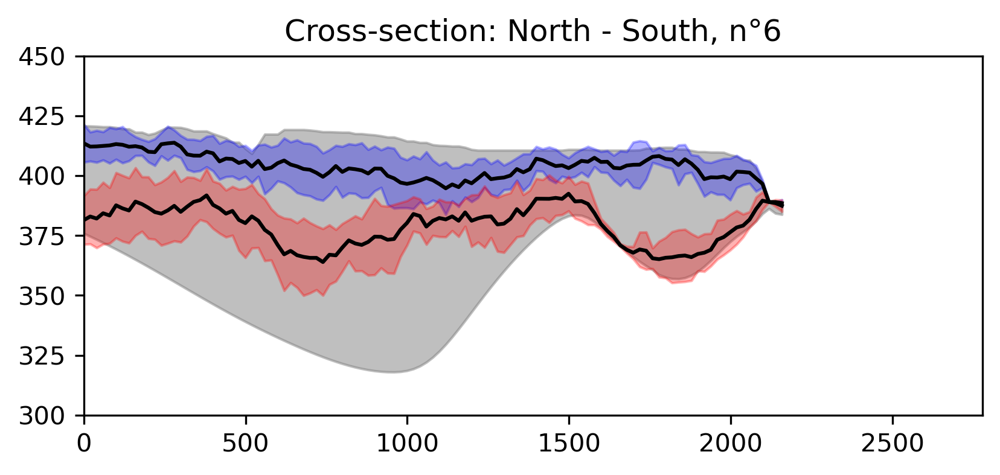

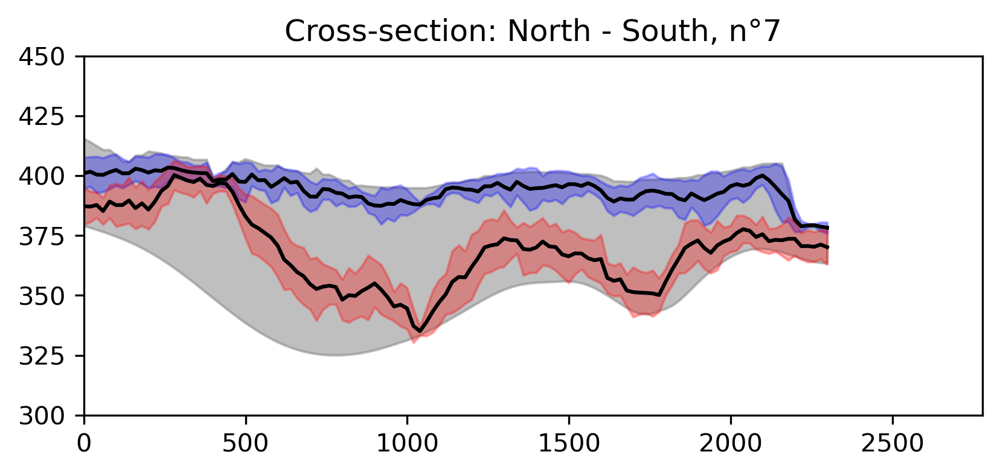

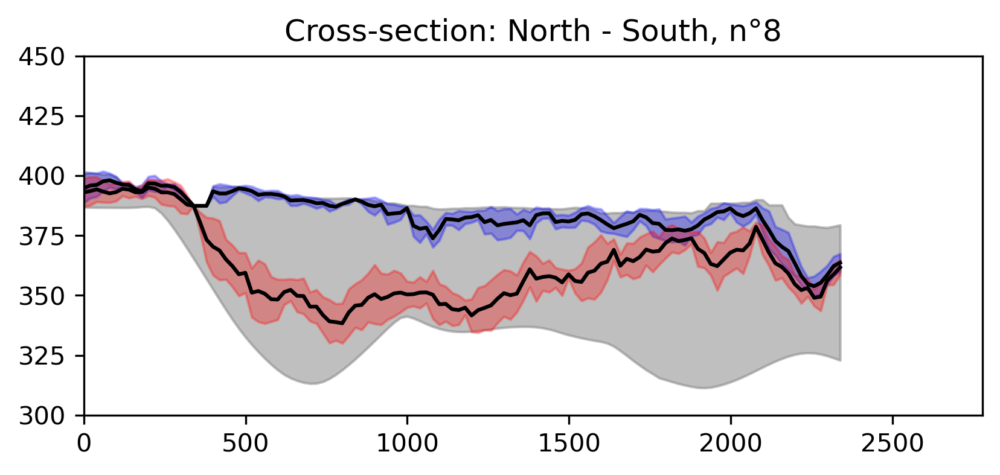

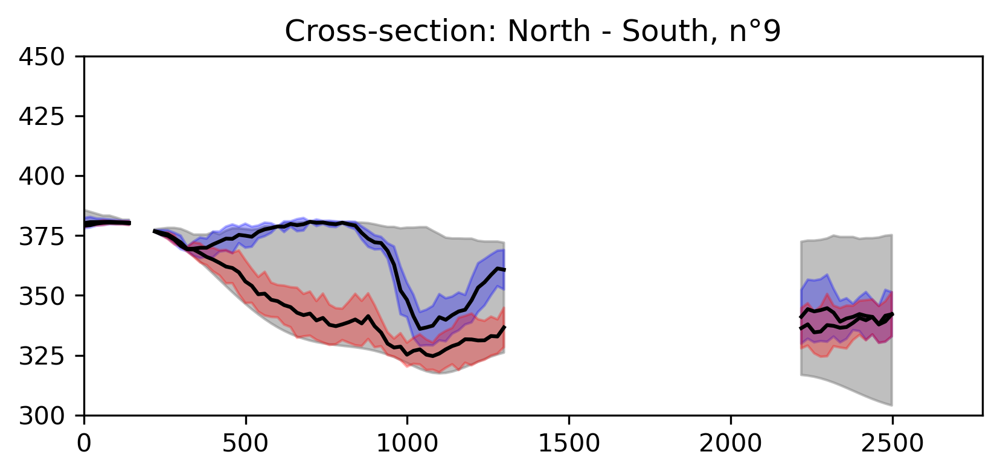

In [26]:
self = T1
ratio_aspect = 2.5
nb_cs = 10

for i_cs in range(1,nb_cs):
    
    p_list = [(X0 + i_cs*(X1-X0)/nb_cs,Y0 + 20),(X0 + i_cs*(X1-X0)/nb_cs,Y1-20)]
    p_list2 = [(X0 + (nb_cs-i_cs)*(X1-X0)/nb_cs,Y0 + 20),(X0 + (nb_cs-i_cs)*(X1-X0)/nb_cs,Y1-20)]
    
    sel_row = top_moy_all[::-1, :][:,int(nx*i_cs/nb_cs)]
    sel_row_std = std_top_moy_all[::-1, :][:,int(nx*i_cs/nb_cs)]
    
    sel_row_b = bot_moy_all[::-1, :][:,int(nx*i_cs/nb_cs)]
    sel_row_std_b = std_bot_moy_all[::-1, :][:,int(nx*i_cs/nb_cs)]
    
    sel_top = top[::-1, :][:,int(nx*i_cs/nb_cs)]
    sel_bot = bot[::-1, :][:,int(nx*i_cs/nb_cs)]
    
    fig, ax = plt.subplots(dpi=300)
    ysec, dist=self.cross_section(arr, p_list2)
    ys = np.linspace(0, dist, ny)
    
    for i in range(len(sel_row)):
        if sel_row[i] != sel_row[i]: #Check if nan, to cut the background color at the same size as the AA limits
            sel_top[i] = np.nan
            sel_bot[i] = np.nan
    
    extent=[0, dist, self.get_oz(), self.get_zg()[-1]]
    a=ax.imshow(ysec, origin="lower", extent=extent, interpolation="none")
    plt.fill_between(ys, sel_top, sel_bot, color='gray',alpha=0.5)
    plt.plot(ys,sel_row,'-',color='k')
    plt.fill_between(ys, sel_row - sel_row_std, sel_row + sel_row_std, color='b',alpha=0.3)
    plt.plot(ys,sel_row_b,'-',color='k')
    plt.fill_between(ys, sel_row_b - sel_row_std_b, sel_row_b + sel_row_std_b, color='r',alpha=0.3)
    ax.set_aspect(abs((extent[1]-extent[0])/(extent[3]-extent[2]))/ratio_aspect)
    plt.title(f'Cross-section: North - South, n°{i_cs}')
    plt.show()

### Alluvion Ancienne bottom elevation

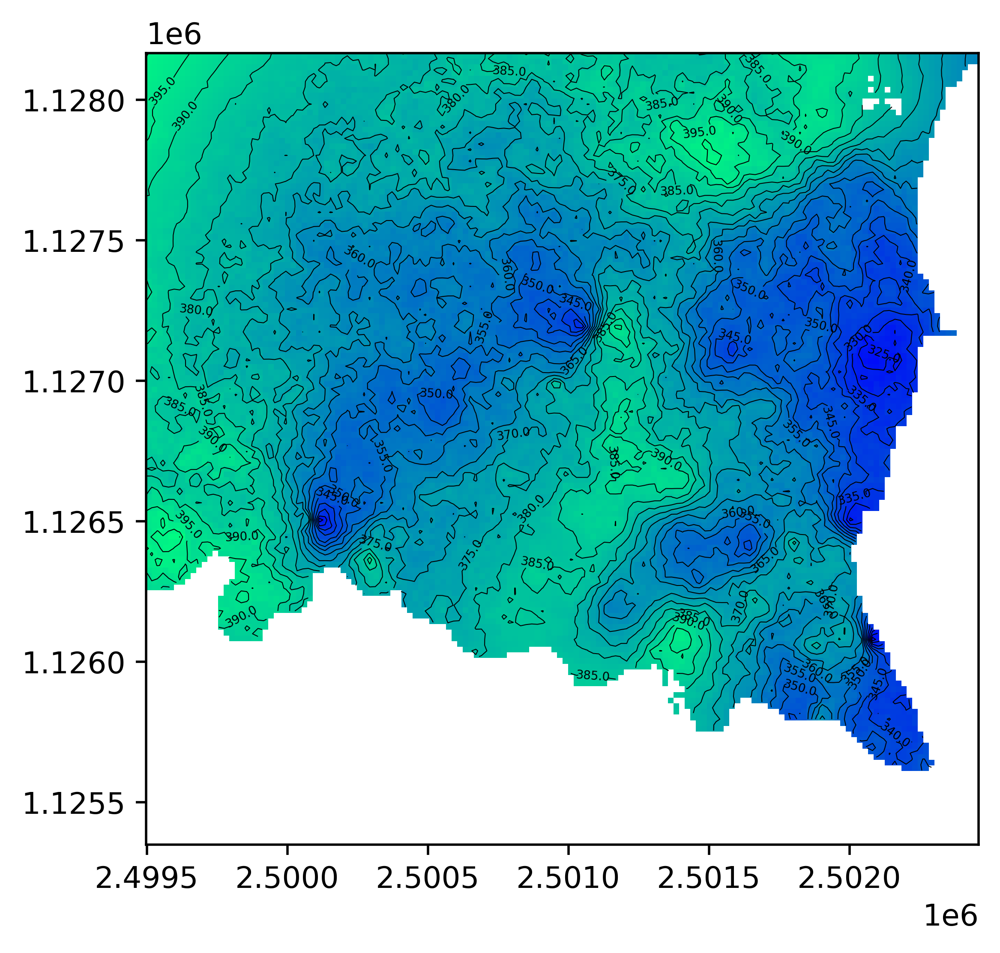

In [27]:
plt.figure(dpi=500)
plt.imshow(bot_moy_all[::-1,:],cmap='winter', extent=[X0,X1,Y0,Y1])
contour = plt.contour(bot_moy_all, colors='k', levels=20, alpha=1, linewidths = 0.3, extent=[X0,X1,Y0,Y1], vmin=315, vmax=406)
plt.clabel(contour, fmt='%.1f', colors='k', fontsize=4)
plt.show()

### Units

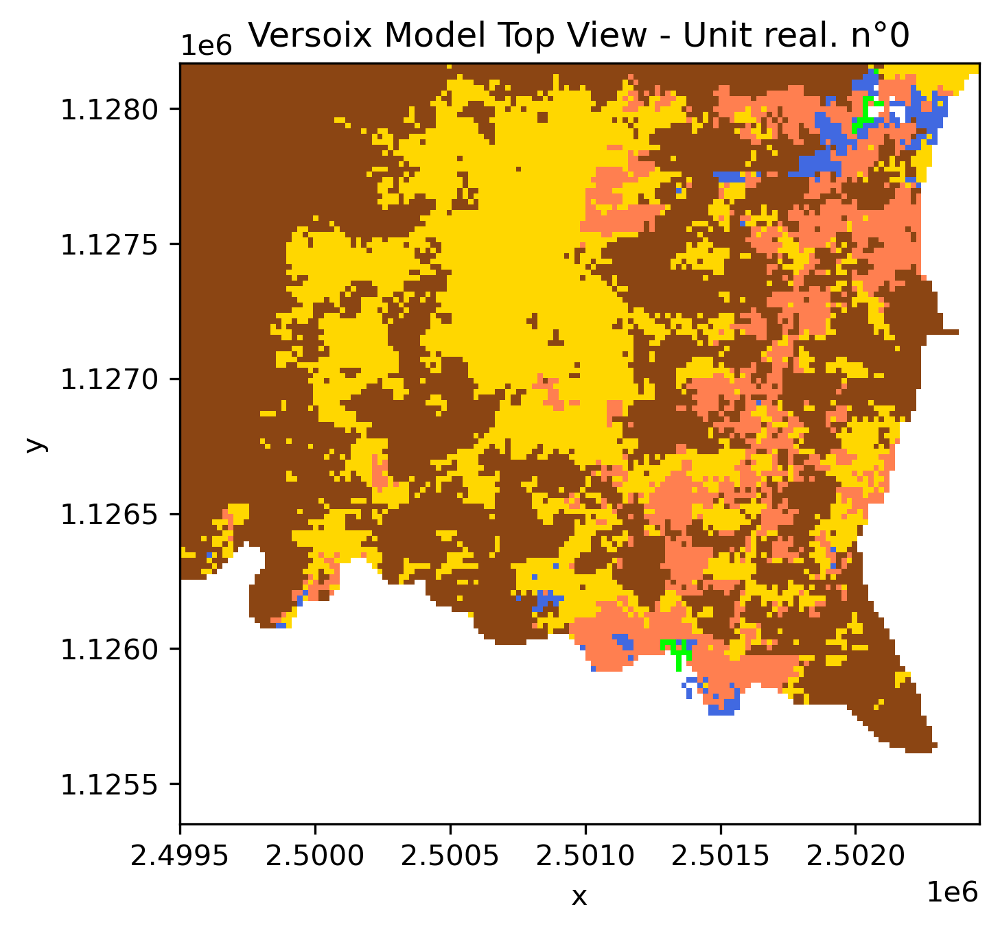

In [28]:
iu = 0 #Unit iteration (realization)

gmap = T1.compute_geol_map(iu=iu, color = True)

plt.figure(dpi=300)
plt.imshow(gmap, origin="lower", extent = [X0,X1,Y0,Y1])
plt.title(f'Versoix Model Top View - Unit real. n°{iu}')
plt.xlabel('x')
plt.ylabel('y')
plt.show()

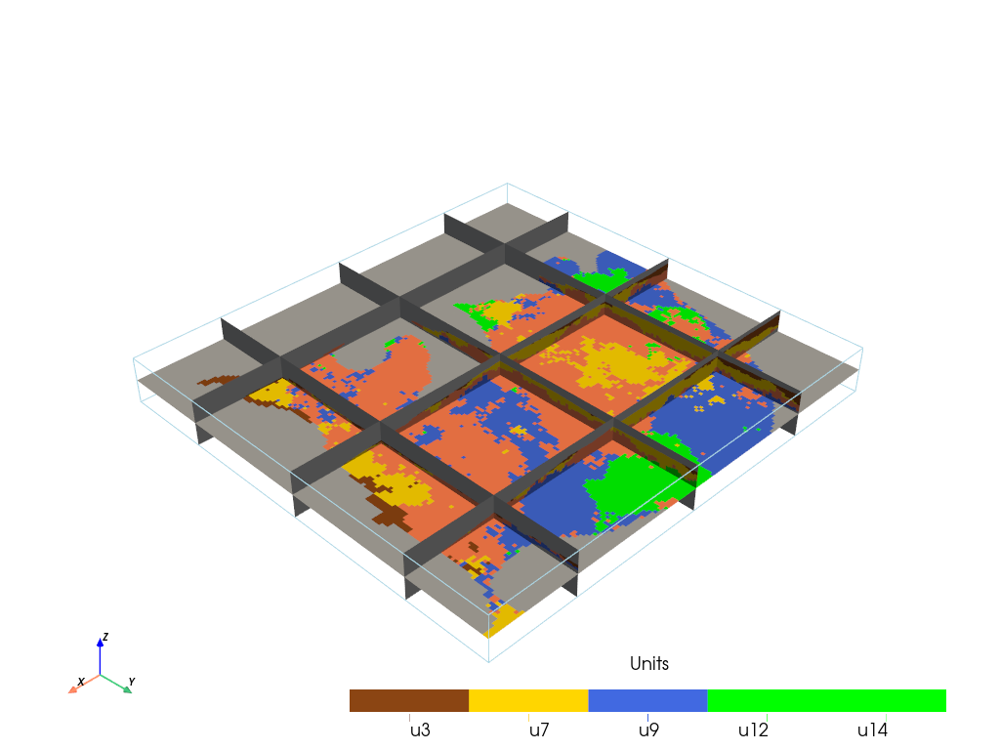

In [29]:
pv.set_jupyter_backend("static")
p = pv.Plotter()
v_ex = 2

T1.plot_units(0, v_ex=v_ex, plotter=p, slicex=(0.2, 0.5, 0.8), slicey=(0.2, 0.5, 0.8), slicez=(0.5))
p.show()

### Mean units

In [30]:
    def plot_cross_section_all(self, p_list, typ="units", arr=None,
                           property=None, esp=None, ax=None, colorbar=False,
                           ratio_aspect=2, i=0,
                           dist_max = 100, width=.5, bh_type="units",
                           vmax=None, vmin=None, rotate=True, unit_arr=None,plot_all=False):

        """
        Plot a cross section along the points given in
        p_list with a spacing defined (esp)

        Parameters
        ----------
        p_list : list or array of tuple containing
                x and y coordinates
                (e.g. p_list=[(100, 200), (300, 200)]
                --> draw a cross section between these two points)
        typ: string
            type of cross section to make. Possible choices are:
            units, facies, prop, proba_units, proba_facies,
            prop_mean, prop_std, entropy_units, entropy_facies
            and arr. "arr" allows to plot any 3D array 
            (with the same grid modeling size)
            that can be provided with the "arr" parameter.
            If typ corresponds to a plot related to a property,
            the specific property must be indicated with the "property"
            parameter.
        iu: int
            units index realization
        ifa: int
            facies index realization
        ip: int
            property index realization
        property: str
            property name that have been computed
        esp: float
            spacing to use when sampling the array along the cross section
        ax: matplotlib axes on which to plot
        colorbar: bool
            if True, show the colorbar
        ratio_aspect: float
            ratio between y and x axis to adjust vertical exaggeration
        i: int
            unit or facies object to plot if typ is "prob_units" or "proba_facies"
        dist_max: float
            maximum distance at which the boreholes are plotted on the cross-section
        width: float
            width of the boreholes on the cross-section (doesn't know the unit of the width so try different values)
        vmax: float
            maximum value for the colorbar
        vmin: float
            minimum value for the colorbar
        """

        if ax is None:
            fig, ax = plt.subplots(figsize=(10, 10))

        def plot_bh(bh, x=None, width=width, typ="units"):

            if typ == "units":
                if bh.log_strati is not None:
                    if x is None:
                        ix = bh.x
                    else:
                        ix = x

                    i = -1
                    for i in range(len(bh.log_strati)-1):
                        s = bh.log_strati[i][1]
                        unit = bh.log_strati[i][0]

                        if i < len(bh.log_strati):
                            s2 = bh.log_strati[i+1][1]

                        if unit is not None:
                            ax.bar(ix, s - s2, bottom=s2, color=unit.c, alpha=1, edgecolor = 'black', width=width)

                    s = bh.log_strati[i+1][1]
                    unit = bh.log_strati[i+1][0]
                    s2 = bh.z - bh.depth
                    if unit is not None:
                        ax.bar(ix, s - s2, bottom=s2, color=unit.c, alpha=1, edgecolor = 'black', width=width)
            
            elif typ == "facies":
                if bh.log_facies is not None:
                    if x is None:
                        ix = bh.x
                    else:
                        ix = x

                    i = -1
                    for i in range(len(bh.log_facies)-1):
                        s = bh.log_facies[i][1]
                        facies = bh.log_facies[i][0]

                        if i < len(bh.log_facies):
                            s2 = bh.log_facies[i+1][1]

                        if facies is not None:
                            ax.bar(ix, s - s2, bottom=s2, color=facies.c, alpha=1, edgecolor = 'black', width=width)

                    s = bh.log_facies[i+1][1]
                    facies = bh.log_facies[i+1][0]
                    s2 = bh.z - bh.depth
                    if facies is not None:
                        ax.bar(ix, s - s2, bottom=s2, color=facies.c, alpha=1, edgecolor = 'black', width=width)

        if typ == "units" and unit_arr.all ==None:
           #arr=self.get_units_domains_realizations(iu=iu, fill="color", all_data=False)
            arr_all=T1.get_units_domains_realizations(fill="ID")
            arr = np.zeros((nz,ny,nx))
            
            for z in range(nz):
                for y in range(ny):
                    for x in range(nx):
                        unit_list = arr_all[:,z,y,x]
                        freq = Counter(np.ndarray.flatten(unit_list))
                        res = sorted(np.ndarray.flatten(unit_list), key=lambda x: -freq[x]) # Sort list a based on frequency (highest frequency first)
                        arr[z,y,x] = res[0]
    
            unit_color = []
            for z in range(nz):
                for y in range(ny):
                    for x in range(nx):
                        ID_unit = arr[z,y,x]
                        if ID_unit == 1.0 :
                            unit_color.append([0.54509804, 0.27058824, 0.0745098 , 1.0 ])
                        elif ID_unit == 2.0 :
                            unit_color.append([1.0 , 0.84313725, 0.0 , 1.0 ])
                        elif ID_unit == 4.0 :
                            unit_color.append([0.25490196, 0.41176471, 0.88235294, 1.0 ])
                        elif ID_unit == 3.0 :
                            unit_color.append([1.0 , 0.49803922, 0.31372549, 1.0 ])
                        elif ID_unit == 5.0 :
                            unit_color.append([0., 1., 0., 1.])
                        elif ID_unit == 0.0 :
                            unit_color.append([0., 0., 0., 0.])

            arr = np.reshape(unit_color, (nz,ny,nx,4))

        elif typ == "units" and unit_arr.all != None:
            arr = unit_arr

        elif typ == 'proba_units':
            units=self.get_units_domains_realizations()
            nreal=units.shape[0]
            arr=(units == i).sum(0)/nreal
            del(units)

        elif typ == 'proba_facies':
            facies=self.get_facies()
            nreal=facies.shape[0] * facies.shape[1]
            arr=(facies == i).sum(0).sum(0) /nreal
            del(facies)
            
        elif typ =="facies":
            arr=self.get_facies(iu, ifa, all_data=False)
            #change values to have colors directly
            new_arr=np.zeros([arr.shape[0], arr.shape[1], arr.shape[2], 4])
            list_fa=np.unique(arr)
            for IDfa in list_fa:
                if IDfa != 0:
                    fa=self.get_facies_obj(ID=IDfa, type="ID")  # get facies object
                    mask=(arr == IDfa)
                    new_arr[mask,: ]=colors.to_rgba(fa.c)
            arr=new_arr

        elif typ =="prop":
            assert isinstance(property, str), "property should be given in a property name --> string"
            arr=self.get_prop(property, iu, ifa, ip, all_data=False)

        elif typ == "prop_mean":
            arr=self.compute_mean_prop(property, inside_units=None, inside_facies=None)

        elif typ == "prop_std":
            assert isinstance(property, str), "property should be given in a property name --> string"
            arr=self.compute_mean_prop(property, type="std", inside_units=None, inside_facies=None)

        elif typ =="entropy_units":
            units=self.get_units_domains_realizations()
            SE=np.zeros(self.mask.shape)  # shannon entropy
            b=len(self.get_all_units())
            nreal=units.shape[0]
            for unit in self.get_all_units():
                # print(unit)
                Pi=(units==unit.ID).sum(0)/nreal
                pi_mask=(self.mask) & (Pi!=0)
                SE[pi_mask] += Pi[pi_mask]*(np.log(Pi[pi_mask])/np.log(b))
                arr=-SE
            arr[~self.mask]=np.nan
            del(units)

        elif typ == "entropy_facies":
            facies_domains=self.get_facies().reshape(-1, self.nz, self.ny, self.nx)
            SE=np.zeros(self.mask.shape)  # shannon entropy
            b=len(self.get_all_facies())
            nreal=facies_domains.shape[0]
            for facies in self.get_all_facies():
                Pi=(facies_domains==facies.ID).sum(0)/nreal
                pi_mask=(self.mask) & (Pi!=0)
                SE[pi_mask] += Pi[pi_mask]*(np.log(Pi[pi_mask])/np.log(b))
                arr=-SE
            arr[~self.mask]=np.nan
            del(facies_domains)

        elif typ =="arr":
            pass
        else:
            assert 'Typ unknown'
            return

        #extract cross section
        xsec, dist=self.cross_section(arr, p_list, esp=esp, rotate=rotate)

        extent=[0, dist, self.get_oz(), self.get_zg()[-1]]
        a=ax.imshow(xsec, origin="lower", extent=extent, interpolation="none", vmax=vmax, vmin=vmin)
        if colorbar:
            plt.colorbar(a, ax=ax, orientation='horizontal')
        ax.set_aspect(abs((extent[1]-extent[0])/(extent[3]-extent[2]))/ratio_aspect)

        del(arr)

        #get boreholes
        dist_tot = 0
        for ip in range(len(p_list)-1):

            p1 = p_list[ip]
            p2 = p_list[ip+1]

            xmin = self.get_ox()
            xmax = self.get_xg()[-1]

            ymin = self.get_oy()
            ymax = self.get_yg()[-1]

            # select bh inside p1 and p2
            sel_bhs = [bh for bh in self.list_bhs if bh.x > xmin and bh.x < xmax and bh.y > ymin and bh.y < ymax]

            # compute dist of sel_bhs to line

            # proj bhs
            for bh in sel_bhs:
                a = p2[0] - p1[0]
                b = p2[1] - p1[1]
                min_x_p = min(p1[0], p2[0])
                max_x_p = max(p1[0], p2[0])
                min_y_p = min(p1[1], p2[1])
                max_y_p = max(p1[1], p2[1])

                if rotate:
                    bh_x, bh_y = self.rotate(np.array([bh.x, bh.y]), self.get_rot_angle())
                else:
                    bh_x, bh_y = bh.x, bh.y
                x_proj = (a**2 * bh_x + b**2 * p2[0] + a * b * (bh_y - p2[1])) / (a**2 + b**2)
                y_proj = (b * x_proj - b * p2[0] + a * p2[1]) / a

                dist_line = ((bh_x - x_proj) ** 2 + (bh_y - y_proj) ** 2)**0.5
                if dist_line < dist_max or plot_all==True:
                    # if ((x_proj > min_x_p) and (x_proj < max_x_p)) and ((y_proj > min_y_p) and (y_proj < max_y_p)):
                    dist = ((x_proj - p1[0]) ** 2 + (y_proj - p1[1]) ** 2)**0.5
                    dist_to_plot = dist_tot + dist

                        # plot bh
                    plot_bh(bh, dist_to_plot, typ=bh_type)

            # increment total distance
            dist_points = ((p2[0] - p1[0]) ** 2 + (p2[1] - p1[1]) ** 2)**0.5
            dist_tot += dist_points

In [31]:
arr_all=T1.get_units_domains_realizations(fill="ID")
arr = np.zeros((nz,ny,nx))

for z in range(nz):
    for y in range(ny):
        for x in range(nx):
            unit_list = arr_all[:,z,y,x]
            freq = Counter(np.ndarray.flatten(unit_list))
            res = sorted(np.ndarray.flatten(unit_list), key=lambda x: -freq[x]) # Sort list a based on frequency (highest frequency first)
            arr[z,y,x] = res[0]

unit_color = []
for z in range(nz):
    for y in range(ny):
        for x in range(nx):
            ID_unit = arr[z,y,x]
            if ID_unit == 1.0 :
                unit_color.append([0.54509804, 0.27058824, 0.0745098 , 1.0 ])
            elif ID_unit == 2.0 :
                unit_color.append([1.0 , 0.84313725, 0.0 , 1.0 ])
            elif ID_unit == 4.0 :
                unit_color.append([0.25490196, 0.41176471, 0.88235294, 1.0 ])
            elif ID_unit == 3.0 :
                unit_color.append([1.0 , 0.49803922, 0.31372549, 1.0 ])
            elif ID_unit == 5.0 :
                unit_color.append([0., 1., 0., 1.])
            elif ID_unit == 0.0 :
                unit_color.append([0., 0., 0., 0.])

unit_arr = np.reshape(unit_color, (nz,ny,nx,4))

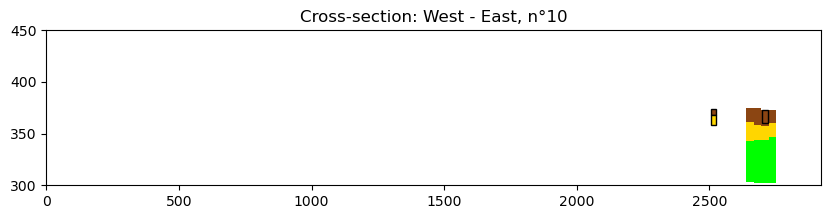

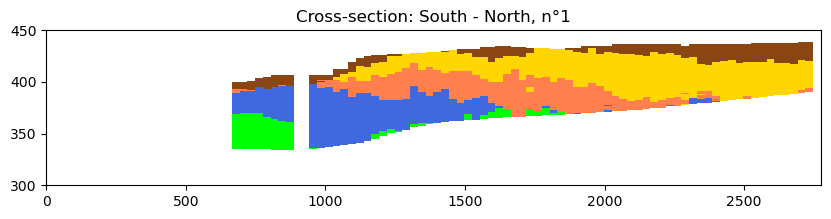

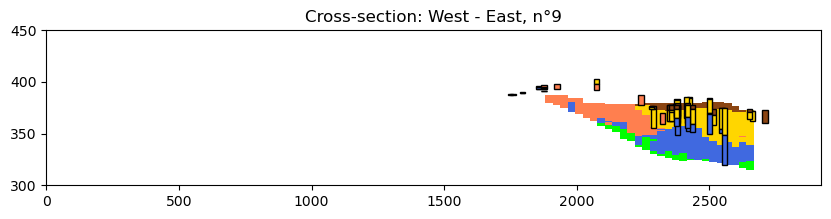

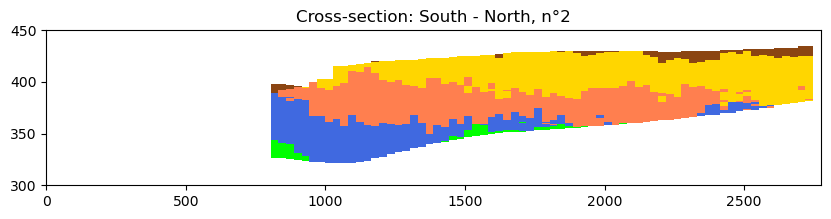

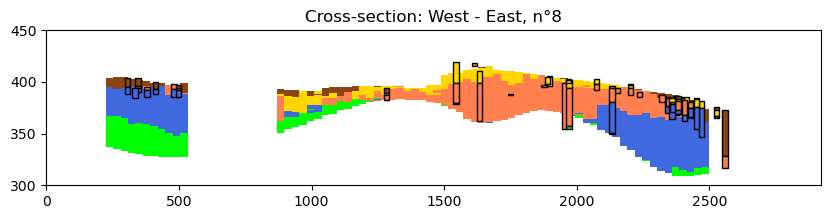

...

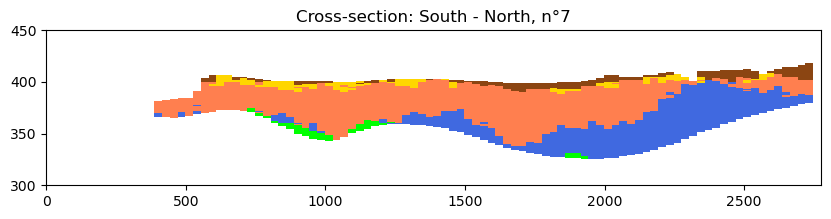

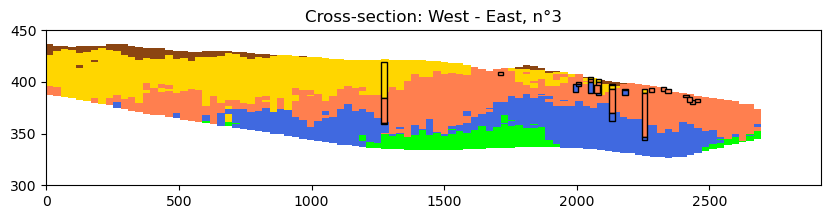

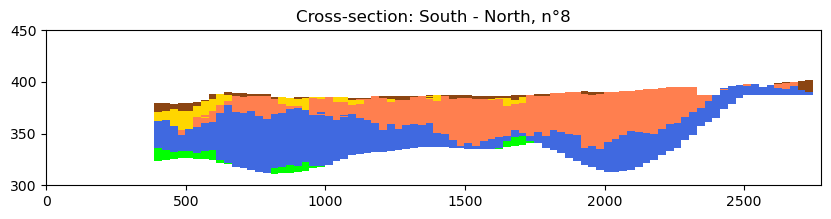

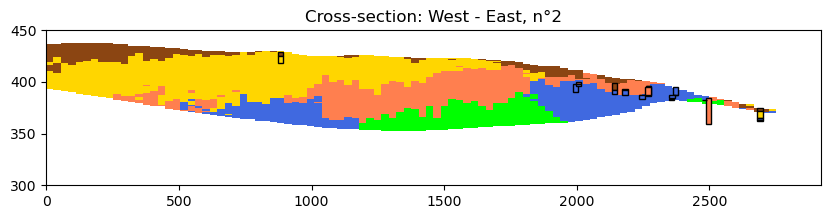

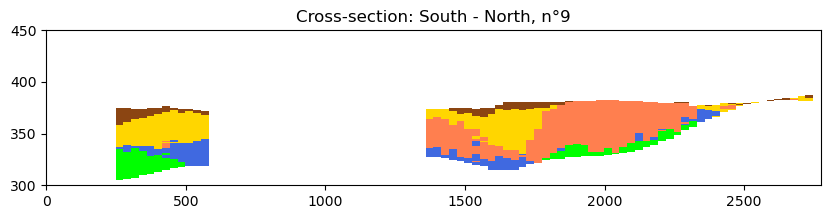

In [32]:
nb_cs = 10

for i_cs in range(1,nb_cs):

    plot_cross_section_all(T1,[(X0+20,Y0 + i_cs*(Y1-Y0)/nb_cs),(X1-20,Y0 + i_cs*(Y1-Y0)/nb_cs)],ratio_aspect=5,typ='units',dist_max=150,width=20,bh_type='units', unit_arr=unit_arr)
    plt.title(f'Cross-section: West - East, n°{11-i_cs}')
    plt.show()

    plot_cross_section_all(T1,[(X0 + i_cs*(X1-X0)/nb_cs,Y0 + 20),(X0 + i_cs*(X1-X0)/nb_cs,Y1-20),(X0 + i_cs*(X1-X0)/nb_cs,Y1-20)],ratio_aspect=5,typ='units',dist_max=150,width=20,bh_type='units', unit_arr=unit_arr)
    plt.title(f'Cross-section: South - North, n°{i_cs}')
    plt.show()
    

## Facies

In [33]:
def compute_facies_map(self, unit, iu=0, ifa=0, color=False):
    
    """
    Compute and return the geological map for given unit realization

    Parameters
    ----------
    unit: string
        unit name defined when creating the unit object
        for more details: :class:`Unit`
    iu: int
        unit realization index
    ifa: int
        facies realization index
    color: bool
        if True return a 3D array with RGBA values

    Returns
    -------
    2D ndarray
        geological map
    """

    ny = self.get_ny()
    nx = self.get_nx()
    nz = self.get_nz()
    arr = self.get_facies(iu, ifa, all_data=False)
    
    mask_unit = self.unit_mask(unit, iu=iu).astype(bool)
    arr[~mask_unit] = 0
    
    geol_map = np.zeros([ny, nx], dtype=np.int8)
    for iz in np.arange(nz-1, 0, -1):
        iy,ix=np.where(arr[iz] != 0)
        slic = geol_map[iy, ix]
        slic[slic == 0] = arr[iz, iy, ix][slic == 0]
        geol_map[iy, ix] = slic

    if color:
        arr_plot = np.ones([ny, nx, 4])

        for iv in np.unique(geol_map):
            
            if iv != 0:
                arr_plot[geol_map == iv, :] = matplotlib.colors.to_rgba(self.get_facies_obj(ID = iv, type="ID").c)
            else:
                arr_plot[geol_map == iv, :] = (1, 1, 1, 1)

        return arr_plot

    return geol_map

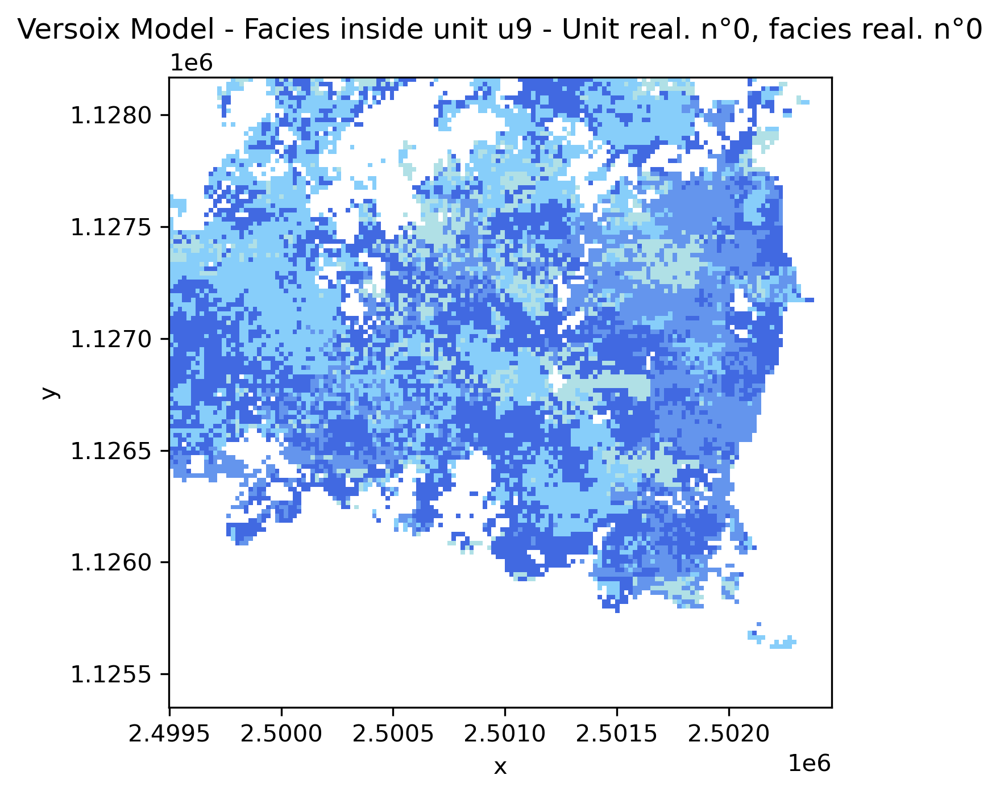

In [34]:
iu = 0
ifa = 0
unit = 'u9'

gmap = compute_facies_map(T1,unit=unit, iu=iu, ifa=ifa, color = True)

plt.figure(dpi=300)
plt.imshow(gmap, origin="lower", extent = [X0,X1,Y0,Y1])
plt.title(f'Versoix Model - Facies inside unit {unit} - Unit real. n°{iu}, facies real. n°{ifa}')
plt.xlabel('x')
plt.ylabel('y')
plt.show()

## Mean facies

In [35]:
def plot_cross_section_all3(f_arr,self, p_list, typ="units", arr=None,
                       property=None, esp=None, ax=None, colorbar=False,
                       ratio_aspect=2, i=0,
                       dist_max = 100, width=.5, bh_type="units",
                       vmax=None, vmin=None, rotate=True, unit_arr=None):

    """
    Plot a cross section along the points given in
    p_list with a spacing defined (esp)

    Parameters
    ----------
    p_list : list or array of tuple containing
            x and y coordinates
            (e.g. p_list=[(100, 200), (300, 200)]
            --> draw a cross section between these two points)
    typ: string
        type of cross section to make. Possible choices are:
        units, facies, prop, proba_units, proba_facies,
        prop_mean, prop_std, entropy_units, entropy_facies
        and arr. "arr" allows to plot any 3D array 
        (with the same grid modeling size)
        that can be provided with the "arr" parameter.
        If typ corresponds to a plot related to a property,
        the specific property must be indicated with the "property"
        parameter.
    iu: int
        units index realization
    ifa: int
        facies index realization
    ip: int
        property index realization
    property: str
        property name that have been computed
    esp: float
        spacing to use when sampling the array along the cross section
    ax: matplotlib axes on which to plot
    colorbar: bool
        if True, show the colorbar
    ratio_aspect: float
        ratio between y and x axis to adjust vertical exaggeration
    i: int
        unit or facies object to plot if typ is "prob_units" or "proba_facies"
    dist_max: float
        maximum distance at which the boreholes are plotted on the cross-section
    width: float
        width of the boreholes on the cross-section (doesn't know the unit of the width so try different values)
    vmax: float
        maximum value for the colorbar
    vmin: float
        minimum value for the colorbar
    """

    if ax is None:
        fig, ax = plt.subplots(figsize=(10, 10))

    def plot_bh(bh, x=None, width=width, typ="units"):

        if typ == "units":
            if bh.log_strati is not None:
                if x is None:
                    ix = bh.x
                else:
                    ix = x

                i = -1
                for i in range(len(bh.log_strati)-1):
                    s = bh.log_strati[i][1]
                    unit = bh.log_strati[i][0]

                    if i < len(bh.log_strati):
                        s2 = bh.log_strati[i+1][1]

                    if unit is not None:
                        ax.bar(ix, s - s2, bottom=s2, color=unit.c, alpha=1, edgecolor = 'black', width=width)

                s = bh.log_strati[i+1][1]
                unit = bh.log_strati[i+1][0]
                s2 = bh.z - bh.depth
                if unit is not None:
                    ax.bar(ix, s - s2, bottom=s2, color=unit.c, alpha=1, edgecolor = 'black', width=width)
        
        elif typ == "facies":
            if bh.log_facies is not None:
                if x is None:
                    ix = bh.x
                else:
                    ix = x

                i = -1
                for i in range(len(bh.log_facies)-1):
                    s = bh.log_facies[i][1]
                    facies = bh.log_facies[i][0]

                    if i < len(bh.log_facies):
                        s2 = bh.log_facies[i+1][1]

                    if facies is not None:
                        ax.bar(ix, s - s2, bottom=s2, color=facies.c, alpha=1, edgecolor = 'black', width=width)

                s = bh.log_facies[i+1][1]
                facies = bh.log_facies[i+1][0]
                s2 = bh.z - bh.depth
                if facies is not None:
                    ax.bar(ix, s - s2, bottom=s2, color=facies.c, alpha=1, edgecolor = 'black', width=width)

    if typ == "units":
       #arr=self.get_units_domains_realizations(iu=iu, fill="color", all_data=False)
        #arr_all=T1.get_units_domains_realizations(fill="ID")
        #arr = np.zeros((nz,ny,nx))
        
        arr = self.realizations_aggregation()
        arr_color = np.zeros((*arr.shape, 4))
        for ID_unit in [1, 2, 4, 3, 5, 0]:
        
            if ID_unit == 1.0 :
                arr_color[arr == ID_unit, :] = [0.54509804, 0.27058824, 0.0745098 , 1.0 ]
            elif ID_unit == 2.0 :
                arr_color[arr == ID_unit, :] = [1.0 , 0.84313725, 0.0 , 1.0 ]
            elif ID_unit == 4.0 :
                arr_color[arr == ID_unit, :] = [0.25490196, 0.41176471, 0.88235294, 1.0 ]
            elif ID_unit == 3.0 :
                arr_color[arr == ID_unit, :] = [1.0 , 0.49803922, 0.31372549, 1.0 ]
            elif ID_unit == 5.0 :
                arr_color[arr == ID_unit, :] = [0., 1., 0., 1.]
            elif ID_unit == 0.0 :
                arr_color[arr == ID_unit, :] = [0., 0., 0., 0.]

        #arr = np.reshape(unit_color, (nz,ny,nx,4))
        arr = arr_color

    elif typ == 'proba_units':
        units=self.get_units_domains_realizations()
        nreal=units.shape[0]
        arr=(units == i).sum(0)/nreal
        del(units)

    elif typ == 'proba_facies':
        facies=self.get_facies()
        nreal=facies.shape[0] * facies.shape[1]
        arr=(facies == i).sum(0).sum(0) /nreal
        del(facies)
        
    elif typ =="facies":
        #arr=self.get_facies(iu, ifa, all_data=False)




        arr = f_arr
        
        #change values to have colors directly
        new_arr=np.zeros([arr.shape[0], arr.shape[1], arr.shape[2], 4])
        list_fa=np.unique(arr)
        for IDfa in list_fa:
            if IDfa != 0:
                fa=self.get_facies_obj(ID=IDfa, type="ID")  # get facies object
                mask=(arr == IDfa)
                new_arr[mask,: ]=colors.to_rgba(fa.c)
        arr=new_arr

    elif typ =="prop":
        assert isinstance(property, str), "property should be given in a property name --> string"
        arr=self.get_prop(property, iu, ifa, ip, all_data=False)

    elif typ == "prop_mean":
        arr=self.compute_mean_prop(property, inside_units=None, inside_facies=None)

    elif typ == "prop_std":
        assert isinstance(property, str), "property should be given in a property name --> string"
        arr=self.compute_mean_prop(property, type="std", inside_units=None, inside_facies=None)

    elif typ =="entropy_units":
        units=self.get_units_domains_realizations()
        SE=np.zeros(self.mask.shape)  # shannon entropy
        b=len(self.get_all_units())
        nreal=units.shape[0]
        for unit in self.get_all_units():
            # print(unit)
            Pi=(units==unit.ID).sum(0)/nreal
            pi_mask=(self.mask) & (Pi!=0)
            SE[pi_mask] += Pi[pi_mask]*(np.log(Pi[pi_mask])/np.log(b))
            arr=-SE
        arr[~self.mask]=np.nan
        del(units)

    elif typ == "entropy_facies":
        facies_domains=self.get_facies().reshape(-1, self.nz, self.ny, self.nx)
        SE=np.zeros(self.mask.shape)  # shannon entropy
        b=len(self.get_all_facies())
        nreal=facies_domains.shape[0]
        for facies in self.get_all_facies():
            Pi=(facies_domains==facies.ID).sum(0)/nreal
            pi_mask=(self.mask) & (Pi!=0)
            SE[pi_mask] += Pi[pi_mask]*(np.log(Pi[pi_mask])/np.log(b))
            arr=-SE
        arr[~self.mask]=np.nan
        del(facies_domains)

    elif typ =="arr":
        pass
    else:
        assert 'Typ unknown'
        return

    #extract cross section
    xsec, dist=self.cross_section(arr, p_list, esp=esp, rotate=rotate)

    extent=[0, dist, self.get_oz(), self.get_zg()[-1]]
    a=ax.imshow(xsec, origin="lower", extent=extent, interpolation="none", vmax=vmax, vmin=vmin)
    if colorbar:
        plt.colorbar(a, ax=ax, orientation='horizontal')
    ax.set_aspect(abs((extent[1]-extent[0])/(extent[3]-extent[2]))/ratio_aspect)

    del(arr)

    #get boreholes
    dist_tot = 0
    for ip in range(len(p_list)-1):

        p1 = p_list[ip]
        p2 = p_list[ip+1]

        xmin = self.get_ox()
        xmax = self.get_xg()[-1]

        ymin = self.get_oy()
        ymax = self.get_yg()[-1]

        # select bh inside p1 and p2
        sel_bhs = [bh for bh in self.list_bhs if bh.x > xmin and bh.x < xmax and bh.y > ymin and bh.y < ymax]

        # compute dist of sel_bhs to line

        # proj bhs
        for bh in sel_bhs:
            a = p2[0] - p1[0]
            b = p2[1] - p1[1]
            min_x_p = min(p1[0], p2[0])
            max_x_p = max(p1[0], p2[0])
            min_y_p = min(p1[1], p2[1])
            max_y_p = max(p1[1], p2[1])

            if rotate:
                bh_x, bh_y = self.rotate(np.array([bh.x, bh.y]), self.get_rot_angle())
            else:
                bh_x, bh_y = bh.x, bh.y
            x_proj = (a**2 * bh_x + b**2 * p2[0] + a * b * (bh_y - p2[1])) / (a**2 + b**2)

            if a == 0:
                y_proj = bh_y
            else:
                y_proj = (b * x_proj - b * p2[0] + a * p2[1]) / a

            #y_proj = (b * x_proj - b * p2[0] + a * p2[1]) / a

            dist_line = ((bh_x - x_proj) ** 2 + (bh_y - y_proj) ** 2)**0.5
            if dist_line < dist_max:
                # if ((x_proj > min_x_p) and (x_proj < max_x_p)) and ((y_proj > min_y_p) and (y_proj < max_y_p)):
                dist = ((x_proj - p1[0]) ** 2 + (y_proj - p1[1]) ** 2)**0.5
                dist_to_plot = dist_tot + dist

                    # plot bh
                plot_bh(bh, dist_to_plot, typ=bh_type)

        # increment total distance
        dist_points = ((p2[0] - p1[0]) ** 2 + (p2[1] - p1[1]) ** 2)**0.5
        dist_tot += dist_points

In [36]:
arr_all = T1.get_facies()
arr = np.zeros((nz,ny,nx))

for z in range(nz):
    for y in range(ny):
        for x in range(nx):
            facies_list = np.ndarray.flatten(arr_all[:,:,z,y,x])
            freq = Counter(facies_list)
            res = sorted(facies_list, key=lambda x: -freq[x]) # Sort list a based on frequency (highest frequency first)
            arr[z,y,x] = res[0]

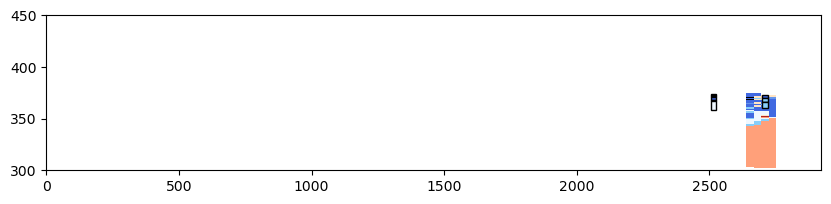

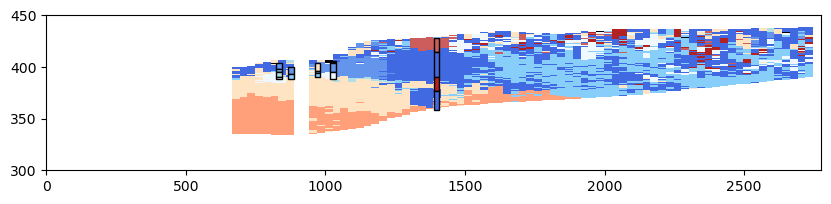

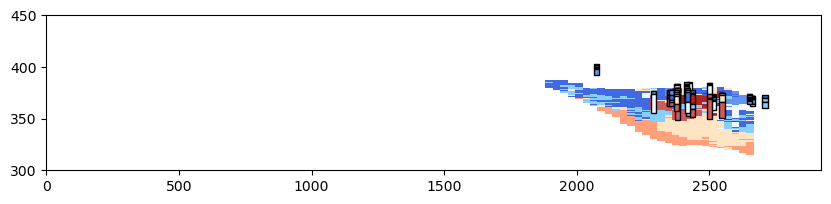

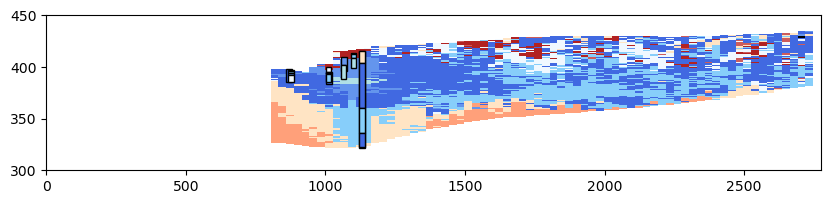

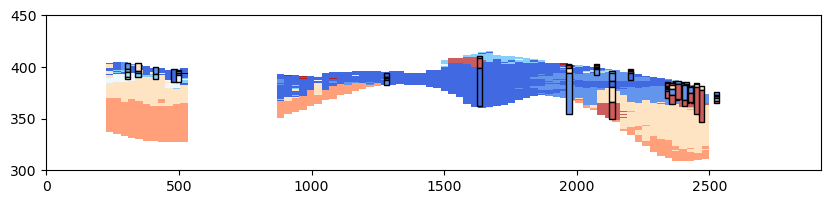

...

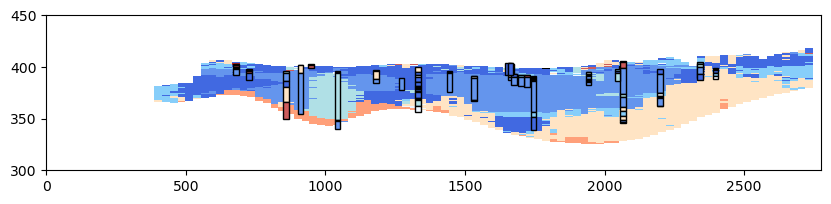

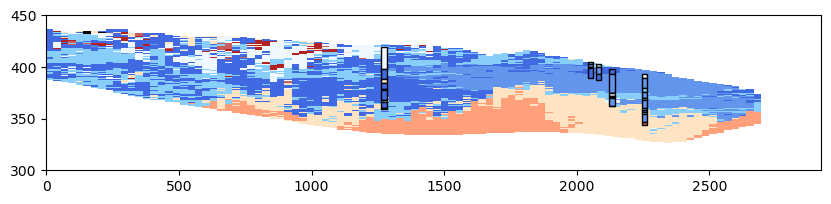

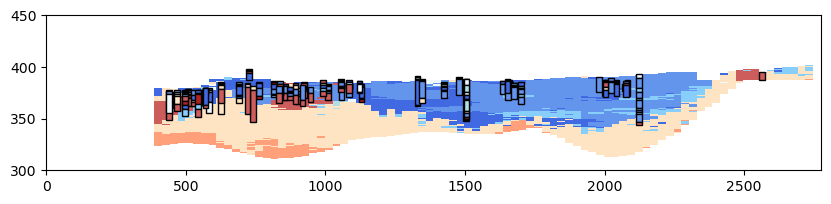

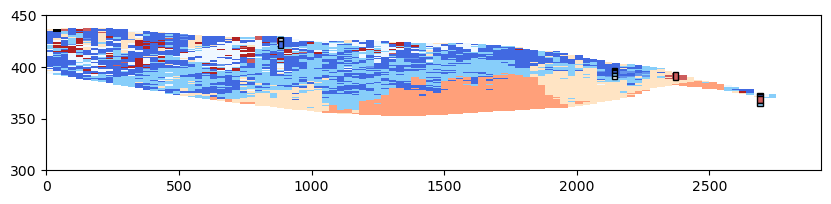

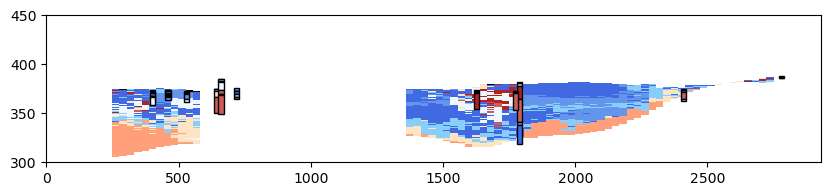

In [37]:
nb_cs = 10

for i_cs in range(1,nb_cs):
    plot_cross_section_all3(arr,T1,[(X0+20,Y0 + i_cs*(Y1-Y0)/nb_cs),(X1-20,Y0 + i_cs*(Y1-Y0)/nb_cs)],ratio_aspect=5,typ='facies',dist_max=150,width=20,bh_type='facies')
    plt.show()
    plot_cross_section_all3(arr,T1,[(X0 + i_cs*(X1-X0)/nb_cs,Y0 + 20),(X0 + i_cs*(X1-X0)/nb_cs,Y1-20),(X0 + i_cs*(X1-X0)/nb_cs,Y1-20)],ratio_aspect=5,typ='facies',dist_max=150,width=20,bh_type='facies')
    plt.show()

## Raster export

In [38]:
dst_crs='EPSG:2056'

In [39]:
X0 = 2499498 #Model x0 coordinate 
Y0 = 1125350 #Model y0 coordinate 
X1 = 2502460
Y1 = 1128167

res_fac = 2 #Reprendre le resolution factor utilisé dans le modèle ArchPy

nx = int(300/res_fac) #Nb of cells
ny = int(280/res_fac)
#nz = int(150/res_fac)
nz = 150
sx = 2962/nx #Cells width (can be floats)
sy = 2817/ny
sz = 150/nz

#arr = np.random.randint(5, size=(100,100)).astype(np.float32)
arr = np.log10(SE_AA[::-1, :])

transform = from_origin(X0, Y1, sx, sy)
crs = rasterio.crs.CRS.from_epsg(2056)

new_dataset = rasterio.open('Entropy_AA.tif', 'w', driver='GTiff',
                            height = arr.shape[0], width = arr.shape[1],
                            count=1, dtype=str(arr.dtype),
                            #crs='+proj=utm +zone=10 +ellps=GRS80 +datum=NAD83 +units=m +no_defs',
                            crs = crs,
                            transform=transform)

new_dataset.write(arr, 1)
new_dataset.close()